# <CENTER> **PROJECT: Corporación Favorita Grocery Sales Forecasting**

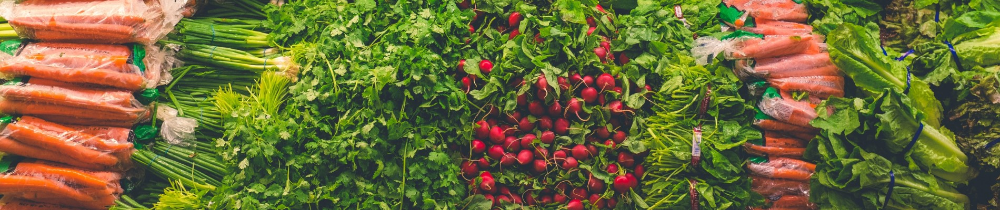

---

#### **Description:**

Brick-and-mortar grocery stores are always in a delicate dance with purchasing and sales forecasting. Predict a little over, and grocers are stuck with overstocked, perishable goods. Guess a little under, and popular items quickly sell out, leaving money on the table and customers fuming.

The problem becomes more complex as retailers add new locations with unique needs, new products, ever transitioning seasonal tastes, and unpredictable product marketing. Corporación Favorita, a large Ecuadorian-based grocery retailer, knows this all too well. They operate hundreds of supermarkets, with over $200,000$ different products on their shelves.

---


#### **Project goal:** 

This project requires forecasting the sales volumes of thousands of products sold in various *Favorita* stores located in Ecuador.

---


#### **Stages of work on the project:**

The project will consist of five parts:

`1.` Basic analysis and familiarization with data,

`2.` Data cleaning,

`3.` Analysis of characteristics and parameters of time series,

`4.` Calculation of factors,

`5.` Machine Learning.

---

**We import the necessary libraries:**

In [52]:
# To work with data
import numpy as np
import pandas as pd
import category_encoders as ce
from imblearn import over_sampling


# To plot graphs:
import seaborn as sns
import plotly.express as px
import plotly.offline as py
import matplotlib.pyplot as plt
import statsmodels.graphics.tsaplots as sgt
import plotly.graph_objects as go


# Для анализа временного ряда
from statsmodels.tsa.stattools import adfuller
from statsmodels.tsa.seasonal import seasonal_decompose
import holidays


# Для разбиения данных и построения модели
from sklearn import model_selection
from sklearn import linear_model
from sklearn import preprocessing
from sklearn import metrics
from pmdarima import auto_arima
from prophet import Prophet
from statsmodels.tsa.arima.model import ARIMA
from statsmodels.tsa.statespace.sarimax import SARIMAX
import xgboost as xgb
from xgboost import plot_importance, plot_tree
from catboost import CatBoostRegressor

**Loading data:**

In [2]:
# Loading DataFrames
train_data = pd.read_csv('data/train.csv')
holidays_events_data = pd.read_csv('data/holidays_events.csv')
items_data = pd.read_csv('data/items.csv')
stores_data = pd.read_csv('data/stores.csv')
transactions_data = pd.read_csv('data/transactions.csv')

C:\Users\User\AppData\Local\Temp\ipykernel_11032\3804561994.py:2: DtypeWarning:

Columns (5) have mixed types. Specify dtype option on import or set low_memory=False.



We will perform the task for store number $25$. Let's select this store:

In [3]:
# Selecting the store
train_df = train_data[train_data.store_nbr == 25].groupby('date')['unit_sales'].sum().reset_index()

=============================================================================================================================================

## <CENTER> **`1.` Basic analysis and familiarization with data**

At this stage, we will study the information provided.

#### $1.1$

**Выведем информацию по таблицам.**

Создаём функцию:

In [4]:
# Создадим функцию для вывода информации по датасету
def check_data_inf(data, data_name = None, length1 = None, length2 = None):
    
    # Выводим размеры таблицы
    print()
    print(f'Данные таблицы "{data_name}" имеют следующую размерность:\n')
    print('Количество строк: {};\nКоличество признаков (столбцов): {}.'.format(data.shape[0], data.shape[1]))
    print('-' * length1)

    # Выведем таблицу
    display(data)
    print('-' * length2)

Displaying the result:

In [5]:
# We're displaying the table information using 'check_data_inf' function
check_data_inf(
    data = train_df.head(),
    data_name = 'train_df',
    length1 = 40,
    length2 = 30
)


Данные таблицы "train_df" имеют следующую размерность:

Количество строк: 5;
Количество признаков (столбцов): 2.
----------------------------------------


,date,unit_sales
0,2013-01-01,2511.619
1,2013-01-02,5316.224
2,2013-01-03,4442.913
3,2013-01-04,4844.354
4,2013-01-05,5817.526


------------------------------


#### **File Descriptions and Data Field Information**

**train.csv**

  * Training data, which includes the target `unit_sales` by `date`, `store_nbr`, and `item_nbr` and a unique `id` to label rows;

  * The target `unit_sales` can be integer (e.g., a bag of chips) or float (e.g., 1.5 kg of cheese);

  * Negative values of `unit_sales` represent returns of that particular item;

  * The `onpromotion` column tells whether that item_nbr was on promotion for a specified `date` and `store_nbr`;

  * Approximately 16% of the `onpromotion` values in this file are `NaN`.

---

#### $1.2$

Displaying information based on the features:

In [6]:
train_df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1618 entries, 0 to 1617
Data columns (total 2 columns):
 #   Column      Non-Null Count  Dtype  
---  ------      --------------  -----  
 0   date        1618 non-null   object 
 1   unit_sales  1618 non-null   float64
dtypes: float64(1), object(1)
memory usage: 25.4+ KB


The data presents features of the following types:

* *object* - 2 features,
* *int64* - 4 features,
* *float64* - 1 feature.

#### $1.3$

Displaying descriptive characteristics based on the features:

In [7]:
train_df.describe()

,unit_sales
count,1618.000000
mean,7058.711912
std,4649.461300
min,2000.439000
25%,4391.145500
50%,5934.198500
75%,8014.677500
max,39140.267000


=============================================================================================================================================

## <CENTER> **`2.` Data cleaning**

На данном этапе проверим данные на наличие пропусков. В случае наличия пропущенных значений, произведём очистку.

Создадим функцию для проверки данных на пропуски:

In [8]:
# Создание функции "nan_checking()"
def nan_checking(data):
    
    # Создание переменной в которую занесём суммарное количество пропусков
    nan_count = data.isnull().sum().sum()
    
    # Делаем проверку на пропуски
    if nan_count == 0:
        print(f'Суммарное количество пропусков в данных: {nan_count}\n\nВ данных отсутствуют пропущенные значения.')
    else:
        print(f'Суммарное количество пропусков в данных: {nan_count}')

Проверим данные на пропуски:

In [9]:
# Применим функцию "nan_checking()" к нашему DataFrame
nan_checking(data = train_df)

Суммарное количество пропусков в данных: 0

В данных отсутствуют пропущенные значения.


=============================================================================================================================================

## <CENTER> **`3.` Analysis of characteristics and parameters of time series**

На данном этапе проведём сезонную декомпозицию ряда, выявим наличие тренда и сезонности.

Для начала приведём признак `date` в формат **datetime**:

In [10]:
# Производим преобразование
train_df['date'] = pd.to_datetime(train_df['date'])

# Выведем получившийся признак
display(train_df['date'])

0      2013-01-01
1      2013-01-02
2      2013-01-03
3      2013-01-04
4      2013-01-05
          ...    
1613   2017-08-11
1614   2017-08-12
1615   2017-08-13
1616   2017-08-14
1617   2017-08-15
Name: date, Length: 1618, dtype: datetime64[ns]

#### $3.1$

**Визуализируем наш ряд:**

Создадим функцию для визуализации временного ряда:

In [11]:
# Создание функции 'visualize_time_series'
def visualize_time_series(data):
    
    
    """
    Функция для визуализации временного ряда.
    
    Аргументы:
        data (pd.DataFrame): DataFrame с двумя столбцами: 'date' (даты) и 'unit_sales' (значения продаж).
        
    """
    
    
    # Задаём заголовок графика
    print('\nВизуализация временного ряда: "Динамика продаж во времени (2013–2017)"')
    print('-' * 123)
    
    
    
    # Создаем фигуру и оси
    plt.rcParams['figure.figsize'] = (30, 17)
    plt.rcParams['font.size'] = 20
    plt.rcParams['xtick.labelsize'] = 10
    plt.rcParams['ytick.labelsize'] = 10
    plt.rcParams['lines.linewidth'] = 3
    
    
    # Строим линейный график
    plt.plot(
        data['date'], 
        data['unit_sales'], 
        label = 'Продажи'
    )
    
    
    # Настраиваем заголовок и подписи осей
    plt.title('Динамика продаж во времени (2013–2017)', fontsize = 20)
    plt.xlabel('Дата', fontsize = 15)
    plt.ylabel('Объем продаж (unit_sales)', fontsize = 15)
    
    # Добавляем сетку для лучшей читаемости
    plt.grid(True, linestyle = '--', alpha = 0.7)
    
    # Настраиваем метки на оси X (например, показывать годы)
    plt.gca().xaxis.set_major_locator(plt.MaxNLocator(5))    # Ограничим количество меток
    plt.gcf().autofmt_xdate()                                # Поворачиваем даты для читаемости
    
    # Добавляем легенду
    plt.legend()
    
    
    
    # Показываем график
    plt.show()
    print('-' * 123)

Визуализируем временной ряд:


Визуализация временного ряда: "Динамика продаж во времени (2013–2017)"
---------------------------------------------------------------------------------------------------------------------------


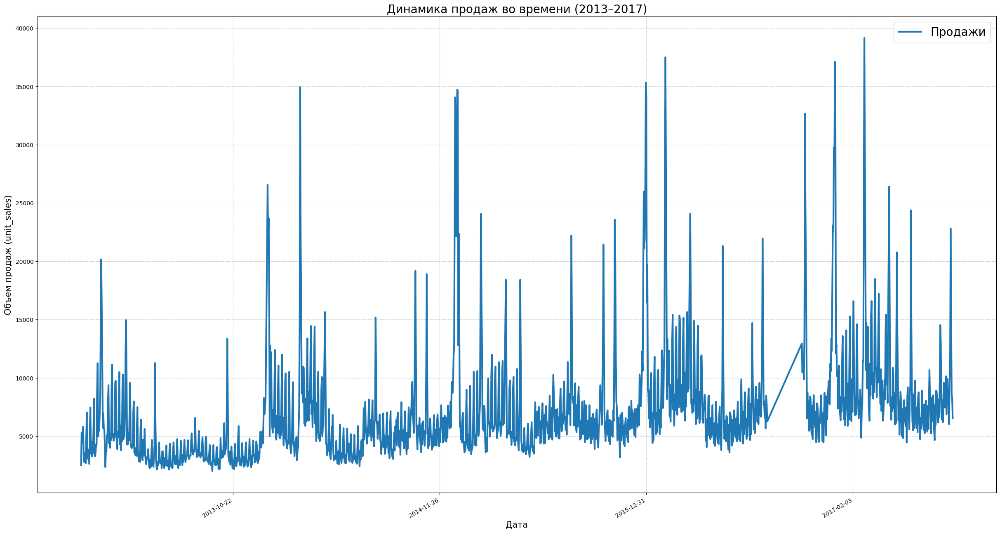

---------------------------------------------------------------------------------------------------------------------------


In [15]:
# Применяем функцию 'visualize_time_series' к нашему ряду
visualize_time_series(data = train_df)

Выделим общий тренд:


Визуализация временного ряда: "Динамика скользящего среднего (30 дней)"
---------------------------------------------------------------------------------------------------------------------------


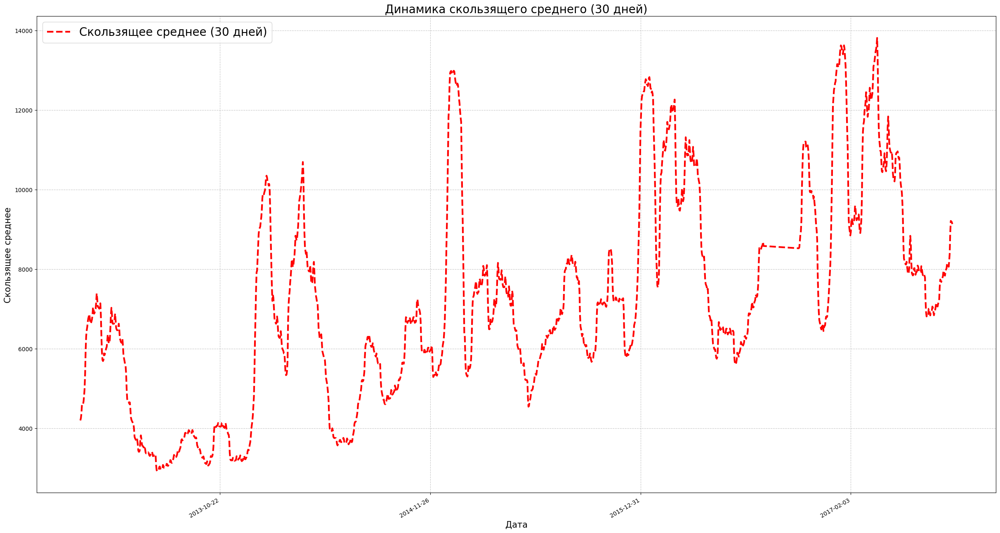

---------------------------------------------------------------------------------------------------------------------------


In [ ]:
# Добавим скользящее среднее (Moving Average), чтобы выделить общий тренд
rolling_avg = train_df['unit_sales'].rolling(window = 30).mean()


# Задаём заголовок графика
print('\nВизуализация временного ряда: "Динамика скользящего среднего (30 дней)"')
print('-' * 123)


# Строим визуализацию
plt.plot(
    train_df['date'],
    rolling_avg,
    color = 'red',
    linestyle = '--',
    label = 'Скользящее среднее (30 дней)'
)    

# Настраиваем заголовок и подписи осей
plt.title('Динамика скользящего среднего (30 дней)', fontsize = 20)
plt.xlabel('Дата', fontsize = 15)
plt.ylabel('Скользящее среднее', fontsize = 15)
    
# Добавляем сетку для лучшей читаемости
plt.grid(True, linestyle = '--', alpha = 0.7)
    
# Настраиваем метки на оси X (например, показывать годы)
plt.gca().xaxis.set_major_locator(plt.MaxNLocator(5))    # Ограничим количество меток
    
# Добавляем легенду
plt.legend()
    
    
    
# Показываем график
plt.show()
print('-' * 123)

**Вывод:**

На графике видны регулярные пики, которые повторяются примерно каждые 5–7 дней. Это может указывать на недельную сезонность: например, продажи растут в определенные дни недели (возможно, в выходные) и падают в другие (будни). Пики становятся выше в определенные периоды года. Например, в конце каждого года (около декабря) наблюдаются более высокие значения, что может быть связано с праздничным сезоном (Рождество, Новый год).

График показывает, что продажи имеют выраженную сезонность (недельную и годовую), но не демонстрируют явного долгосрочного роста или падения. Есть аномалии (пики и провалы), которые требуют дополнительного анализа.

#### $3.2$

**Сделаем сезонную декомпозицию.**

Разложим временной ряд на три компоненты: тренд, сезонность и остаток (шум). 

Для этого создадим функцию для визуализации:

In [17]:
# Создаём функцию 'decompose_time_series'
def decompose_time_series(data):
    
    
    """
    Функция для выполнения сезонной декомпозиции временного ряда.
    
    Аргументы:
        data (pd.DataFrame): DataFrame с столбцами 'date' и 'unit_sales'.
        
    """
    
    
    # Задаём заголовок графика
    print('\nВизуализация временного ряда: "Сезонная декомпозиция временного ряда"')
    print('-' * 123)
    
    
    # Устанавливаем столбец 'date' как индекс
    data.set_index('date', inplace=True)
    
    
    
    # Выполняем сезонную декомпозицию
    # Предполагаем недельную сезонность (период = 7 дней)
    decomposition = seasonal_decompose(
        data['unit_sales'], 
        model = 'additive', 
        period = 7
    )
    
    
    
    # Создаем фигуру с 4 подграфиками
    plt.rcParams['figure.figsize'] = (30, 17)
    
    # Оригинальный ряд
    plt.subplot(4, 1, 1)
    plt.plot(decomposition.observed)
    plt.title('Оригинальный временной ряд', fontsize = 14)
    plt.ylabel('unit_sales')
    
    # Тренд
    plt.subplot(4, 1, 2)
    plt.plot(decomposition.trend)
    plt.title('Тренд', fontsize = 14)
    plt.ylabel('unit_sales')
    
    # Сезонность
    plt.subplot(4, 1, 3)
    plt.plot(decomposition.seasonal)
    plt.title('Сезонность (период = 7 дней)', fontsize = 14)
    plt.ylabel('unit_sales')
    
    # Остаток (шум)
    plt.subplot(4, 1, 4)
    plt.plot(decomposition.resid)
    plt.title('Остаток', fontsize = 14)
    plt.ylabel('unit_sales')
    plt.xlabel('Дата')
    
    # Настраиваем общий вид
    plt.tight_layout()
    
    
    # Показываем график
    plt.show()
    print('-' * 123)

Применим её к нашему ряду:


Визуализация временного ряда: "Сезонная декомпозиция временного ряда"
---------------------------------------------------------------------------------------------------------------------------


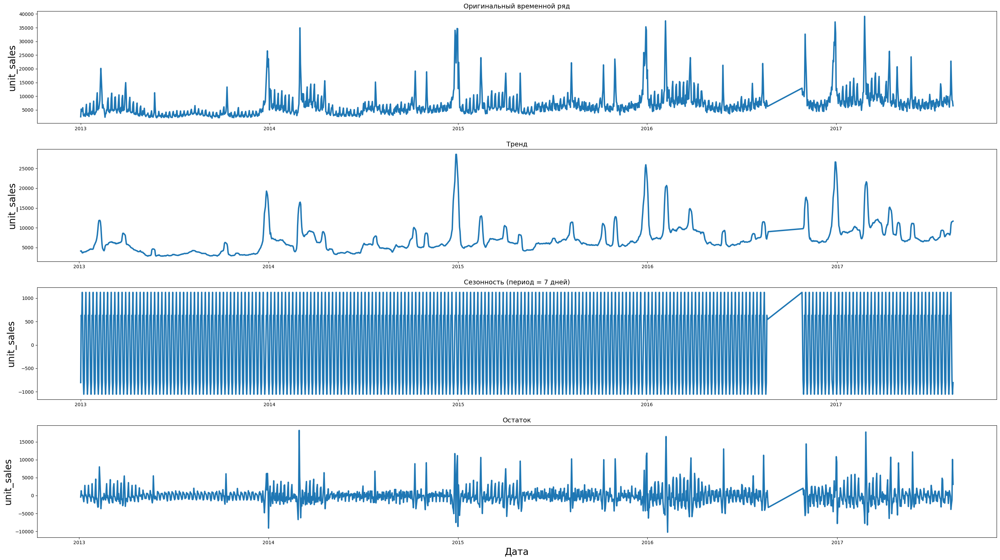

---------------------------------------------------------------------------------------------------------------------------


In [18]:
# Создаём копию основного датасета
data_copy = train_df.copy()

# Вызов функции
decompose_time_series(data_copy)

**Вывод:**

Временной ряд имеет выраженную недельную сезонность (период = 7 дней), что отражает регулярные колебания продаж, вероятно, связанные с днями недели (высокие продажи в выходные, низкие — в будни). Долгосрочный тренд отсутствует или слабый. Продажи остаются относительно стабильными с 2013 по 2017 год, с локальными всплесками, которые могут быть связаны с внешними факторами (акции, праздники).

Вычислим, сколько элементов содержит шумовая часть:

In [19]:
# Выполняем сезонную декомпозицию с аддитивной моделью и периодом 7 дней
decomposition = seasonal_decompose(
    train_df['unit_sales'],
    model = 'additive',
    period = 7
)



# Вычисляем шумовую компоненту
residual_component = decomposition.resid

# Вычисляем общее количество элементов
total_elements = len(residual_component)

# Выводим результат
print(f'Общее количество элементов в шумовой части: {total_elements}')

Общее количество элементов в шумовой части: 1618


Вычислим, сколько числовых элементов содержит шумовая часть:

In [20]:
# Вычисляем общее количество числовых элементов
total_num_elements = residual_component.dropna().shape[0]

# Выводим результат
print(f'Общее количество числовых элементов в шумовой части: {total_num_elements}')

Общее количество числовых элементов в шумовой части: 1612


Вычислим, сколько элементов содержит сезонная часть:

In [21]:
# Вычисляем сезонную компоненту
seasonal_component = decomposition.seasonal

# Вычисляем общее количество элементов
total_elements = len(seasonal_component)

# Выводим результат
print(f'Общее количество элементов в сезонной части: {total_elements}')

Общее количество элементов в сезонной части: 1618


Вычислим, сколько числовых элементов содержит трендовая часть:

In [22]:
# Вычисляем трендовую компоненту
trend_component = decomposition.trend

# Вычисляем общее количество числовых элементов
total_num_elements = trend_component.dropna().shape[0]

# Выводим результат
print(f'Общее количество числовых элементов в трендовой части: {total_num_elements}')

Общее количество числовых элементов в трендовой части: 1612


Создаём функцию для построения визуализации элементов трендовой части:

In [26]:
# Создаём функцию 'compute_trend_elements' для подсчёта и визуализации элементов трендовой части
def compute_trend_elements(data):
    
    
    """    Функция для вычисления количества элементов в трендовой части временного ряда и их визуализации.
    
    Аргументы:
        data (pd.DataFrame): DataFrame с двумя столбцами: 'date' и 'unit_sales'.
        
    Возвращает:
        total_elements (int): Общее количество элементов в трендовой части.
        total_num_elements (int): Общее количество числовых элементов в трендовой части.
        
    """
    
    
    # Задаём заголовок графика
    print('\nВизуализация временного ряда: "Трендовая компонента временного ряда"')
    print('-' * 123)
    
    
    # Выполняем сезонную декомпозицию с аддитивной моделью и периодом 7 дней
    decomposition = seasonal_decompose(
        data['unit_sales'], 
        model = 'additive', 
        period = 7
    )
    
    
    
    # Вычисляем трендовую компоненту
    trend_component = decomposition.trend
    
    # Вычисляем общее количество элементов
    total_elements = len(trend_component)
    
    # Вычисляем общее количество числовых элементов
    total_num_elements = trend_component.dropna().shape[0]
    
    # Выводим результаты
    print(f'Общее количество элементов в трендовой части: {total_elements}')
    print(f'Общее количество числовых элементов в трендовой части: {total_num_elements}')
    
    
    
    # Построим визуализацию
    plt.figure(figsize = (30, 17))
    plt.plot(trend_component)
    plt.title('Трендовая компонента', fontsize = 20)
    plt.ylabel('График продаж', fontsize = 15)
    plt.xlabel('Дата', fontsize = 15)
    plt.grid(True, linestyle = '--', alpha = 0.7)
    plt.gca().xaxis.set_major_locator(plt.MaxNLocator(5))    # Ограничим количество меток
    plt.legend(['Трендовая компонента'])
    plt.tight_layout()
    
    # Показываем график
    plt.show()
    print('-' * 123)
    
    return total_elements, total_num_elements

Построим график:


Визуализация временного ряда: "Трендовая компонента временного ряда"
---------------------------------------------------------------------------------------------------------------------------
Общее количество элементов в трендовой части: 1618
Общее количество числовых элементов в трендовой части: 1612


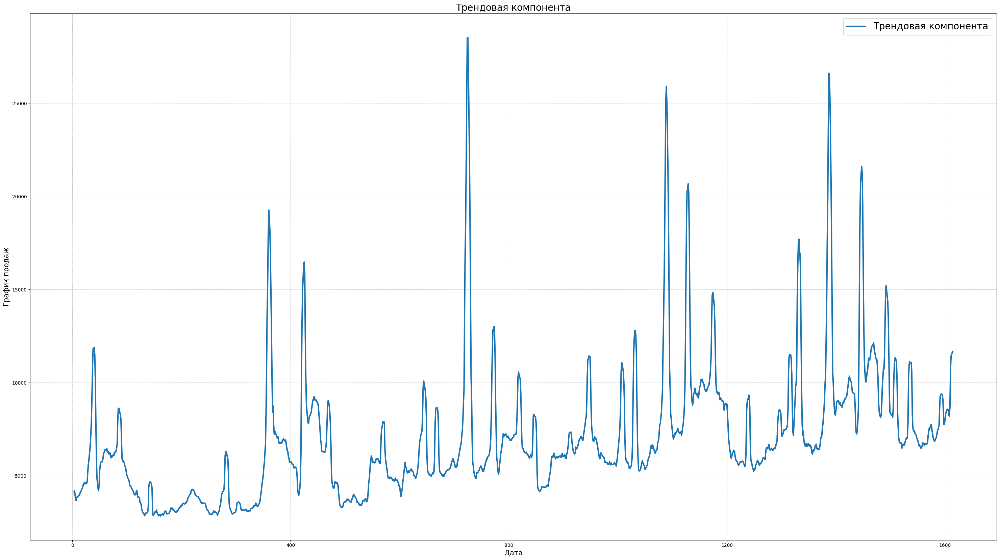

---------------------------------------------------------------------------------------------------------------------------


In [27]:
# Вызов функции
total_elements, total_num_elements = compute_trend_elements(train_df)

Создадим функцию для построения графиков автокорреляционной функции (**ACF**) и частичной автокорреляционной функции (**PACF**):

In [28]:
# Создание функции "plot_acf_pacf"
def plot_acf_pacf(series):
    
    
    """    Функция для построения графиков ACF и PACF временного ряда.
    
    Аргументы:
        series (pd.Series): Временной ряд, для которого нужно построить графики ACF и PACF.
        
    Возвращает:
        None: Функция выводит графики ACF и PACF, но не возвращает никаких значений.
        
    """
    
    
    # Задаём заголовок графика
    print('\nВизуализация временного ряда: "Графики ACF и PACF"')
    print('-' * 123)
    
    
    
    # Задаём размеры графиков
    plt.rcParams['figure.figsize'] = (30, 12)
    
    # Задаём количество графиков
    fig, axes = plt.subplots(1, 2)
    
    
    
    # Задаём настройки графика "acf"
    plt.subplot(121)
    
    sgt.plot_acf(
        series,
        ax = axes[0],
        lags = 20
    )
    
    plt.title('ACF (для определения q)')
    plt.xlabel('Лаги')
    plt.ylabel('Корреляция')
    plt.grid(True, linestyle = '--', alpha = 0.7)
    plt.tight_layout()
    
    
    
    # Задаём настройки графика "pacf"
    plt.subplot(122)
    
    sgt.plot_pacf(
        series,
        ax = axes[1],
        lags = 20,
        method = 'ywm'
    )
    
    plt.title('PACF (для определения p)')
    plt.xlabel('Лаги')
    plt.ylabel('Корреляция')
    plt.grid(True, linestyle = '--', alpha = 0.7)
    plt.tight_layout()
    
    
    
    # Выводим график
    plt.show()
    print('-' * 123)

Построим графики автокорреляционной функции (*ACF*) и частичной автокорреляционной функции (*PACF*):


Визуализация временного ряда: "Графики ACF и PACF"
---------------------------------------------------------------------------------------------------------------------------


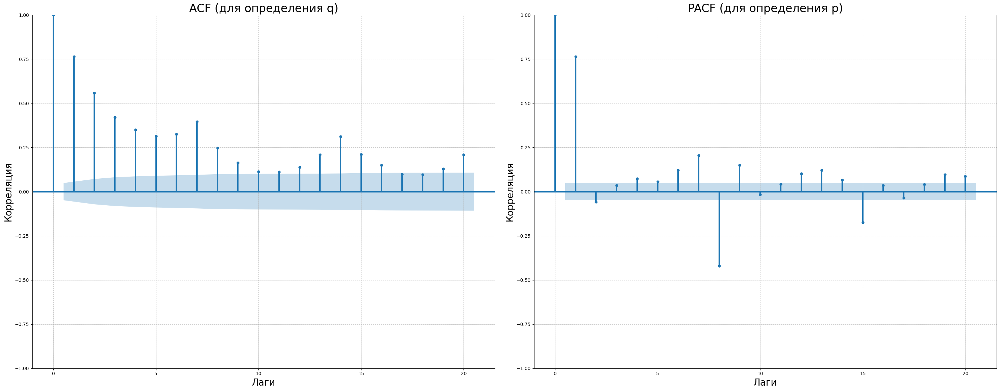

---------------------------------------------------------------------------------------------------------------------------


In [29]:
# Применяем функцию 'plot_acf_pacf' 
plot_acf_pacf(train_df['unit_sales'].dropna())

#### $3.2$

**Проведём тест Дики-Фуллера.**

Создаём функцию `adfuller_test`:

In [36]:
# Создание функции
def adfuller_test(series):
    
    # Проводим тест
    adf_test = adfuller(series)
    
    print('\nРезультаты теста Дики-Фуллера:')
    print('-' * 30)
    print('\n')
    
    # Выводим результаты теста
    print(f'Значение теста Дики-Фуллера: {adf_test[0]:.3f}')
    print('-' * 100)
    print(f'Значение p-value: {adf_test[1]:.3f}')
    print('-' * 100)
    print(f'Критическое значение: {adf_test[4]}')
    print('-' * 100)
    print()
    
    
    
    # Проверка, больше ли критического полученное значение для нашего ряда 
    if adf_test[0] > adf_test[4]['5%']:
        print('Не отвергаем гипотезу H0: ряд не стационарен.')
    else:
        print('Отвергаем гипотезу H1: ряд стационарен.')

Применяем полученную функцию к данным:

In [37]:
# Применяем функцию "adfuller_test" к "train_df['unit_sales']"
adfuller_test(train_df['unit_sales'])


Результаты теста Дики-Фуллера:
------------------------------


Значение теста Дики-Фуллера: -4.859
----------------------------------------------------------------------------------------------------
Значение p-value: 0.000
----------------------------------------------------------------------------------------------------
Критическое значение: {'1%': -3.4344642432857992, '5%': -2.8633571955690647, '10%': -2.5677374399794197}
----------------------------------------------------------------------------------------------------

Отвергаем гипотезу H1: ряд стационарен.


=============================================================================================================================================

## <CENTER> **`4.` Calculation of factors**

На данном этапе рассчитаем факторы и построим визуализации.

#### $4.1$

Разабъём временной ряд на три (*train + test*) набора:

In [38]:
# Сортировка по дате
train_df = train_df.sort_values('date')


# Инициализация TimeSeriesSplit
tscv_split = model_selection.TimeSeriesSplit(
    n_splits = 3,
    test_size = 7
)


# Разбиение данных
for fold, (train_index, test_index) in enumerate(tscv_split.split(train_df)):
    train_data_fold = train_df.iloc[train_index]
    test_data_fold = train_df.iloc[test_index]
    
    print()
    print(f"Fold {fold + 1}:")
    print(f"Train indices: {train_index}")
    print(f"Test indices: {test_index}")
    print(f"Train shape: {train_data_fold.shape}")
    print(f"Test shape: {test_data_fold.shape}")
    print(f"Train dates range: {train_data_fold['date'].min()} to {train_data_fold['date'].max()}")
    print(f"Test dates range: {test_data_fold['date'].min()} to {test_data_fold['date'].max()}")
    print(f'TRAIN size: {len(train_index)},\nTEST size: {len(test_index)}')
    print('-' * 65)
    print()
    
    
    
# Получение наборов для последнего сплита
train_data_fold = train_df.iloc[train_index]
test_data_fold = train_df.iloc[test_index]


Fold 1:
Train indices: [   0    1    2 ... 1594 1595 1596]
Test indices: [1597 1598 1599 1600 1601 1602 1603]
Train shape: (1597, 2)
Test shape: (7, 2)
Train dates range: 2013-01-01 00:00:00 to 2017-07-25 00:00:00
Test dates range: 2017-07-26 00:00:00 to 2017-08-01 00:00:00
TRAIN size: 1597,
TEST size: 7
-----------------------------------------------------------------


Fold 2:
Train indices: [   0    1    2 ... 1601 1602 1603]
Test indices: [1604 1605 1606 1607 1608 1609 1610]
Train shape: (1604, 2)
Test shape: (7, 2)
Train dates range: 2013-01-01 00:00:00 to 2017-08-01 00:00:00
Test dates range: 2017-08-02 00:00:00 to 2017-08-08 00:00:00
TRAIN size: 1604,
TEST size: 7
-----------------------------------------------------------------


Fold 3:
Train indices: [   0    1    2 ... 1608 1609 1610]
Test indices: [1611 1612 1613 1614 1615 1616 1617]
Train shape: (1611, 2)
Test shape: (7, 2)
Train dates range: 2013-01-01 00:00:00 to 2017-08-08 00:00:00
Test dates range: 2017-08-09 00:00:00

#### $4.2$

Построим скользящее среднее c окном $5$:


Визуализация временного ряда: "Скользящее среднее (окно = 5)"
---------------------------------------------------------------------------------------------------------------------------


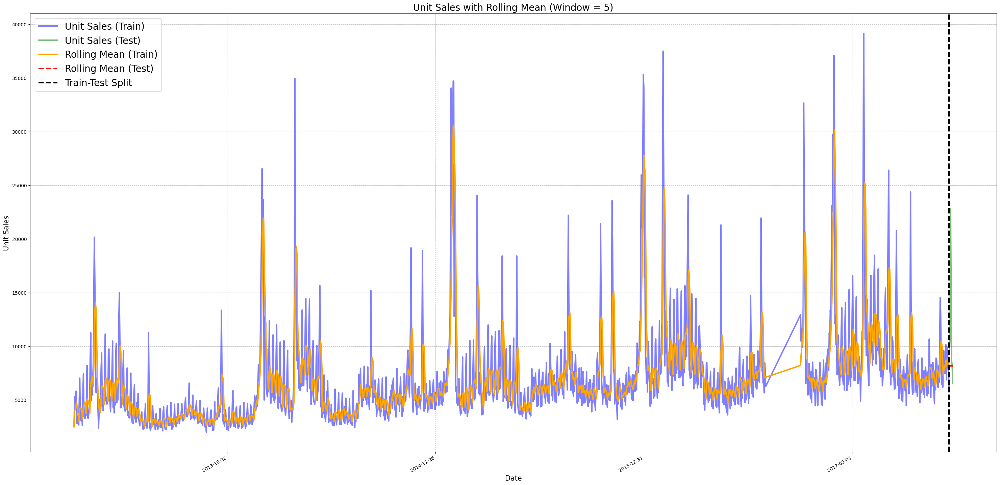

---------------------------------------------------------------------------------------------------------------------------
Train Data (последние 5 строк):

           date  unit_sales  rolling_mean_5
1606 2017-08-04    9276.890       8335.1820
1607 2017-08-05    9910.015       8826.8504
1608 2017-08-06    8064.109       8852.2286
1609 2017-08-07    7527.348       8330.4328
1610 2017-08-08    6025.029       8160.6782
---------------------------------------------

Test Data (все строки):

           date  unit_sales  rolling_mean_5
1611 2017-08-09    9707.858       8160.6782
1612 2017-08-10   10781.434       8160.6782
1613 2017-08-11   22800.841       8160.6782
1614 2017-08-12   15090.753       8160.6782
1615 2017-08-13    8570.598       8160.6782
1616 2017-08-14    8244.854       8160.6782
1617 2017-08-15    6522.788       8160.6782
---------------------------------------------


In [ ]:
# Построение скользящего среднего на тренировочной выборке
train_data_fold.loc[:, 'rolling_mean_5'] = train_data_fold['unit_sales'].rolling(window = 5, min_periods = 1).mean()

# Для тестовой выборки используем последнее значение скользящего среднего из тренировочной выборки
test_data_fold.loc[:, 'rolling_mean_5'] = train_data_fold['rolling_mean_5'].iloc[-1]


# Задаём заголовок графика
print('\nВизуализация временного ряда: "Скользящее среднее (окно = 5)"')
print('-' * 123)


# Строим визуализацию
plt.figure(figsize = (30, 17))
plt.plot(train_data_fold['date'], train_data_fold['unit_sales'], label = 'Unit Sales (Train)', alpha = 0.5, color = 'blue')
plt.plot(test_data_fold['date'], test_data_fold['unit_sales'], label = 'Unit Sales (Test)', alpha = 0.5, color = 'green')
plt.plot(train_data_fold['date'], train_data_fold['rolling_mean_5'], label = 'Rolling Mean (Train)', color = 'orange')
plt.plot(test_data_fold['date'], test_data_fold['rolling_mean_5'], label = 'Rolling Mean (Test)', color = 'red', linestyle = '--')
plt.axvline(x = train_data_fold['date'].max(), color = 'black', linestyle = '--', label = 'Train-Test Split')
plt.title('Unit Sales with Rolling Mean (Window = 5)', fontsize = 20)
plt.grid(True, linestyle = '--', alpha = 0.7)
plt.xlabel('Date', fontsize = 15)
plt.ylabel('Unit Sales', fontsize = 15)
plt.legend()
plt.tight_layout()
plt.gca().xaxis.set_major_locator(plt.MaxNLocator(5))    # Ограничим количество меток

# Показываем график
plt.show()
print('-' * 123)



# Вывод результатов
print('Train Data (последние 5 строк):\n')
print(train_data_fold.tail())
print('-' * 45)
print()

print('Test Data (все строки):\n')
print(test_data_fold)
print('-' * 45)

**Вывод:**

График показывает сглаженный тренд на тренировочных данных и экстраполированное значение на тестовых.

#### $4.3$

Построим скользящее квадратическое отклонение c окном $5$: 


Визуализация временного ряда: "Скользящее квадратическое отклонение (окно = 5)"
---------------------------------------------------------------------------------------------------------------------------


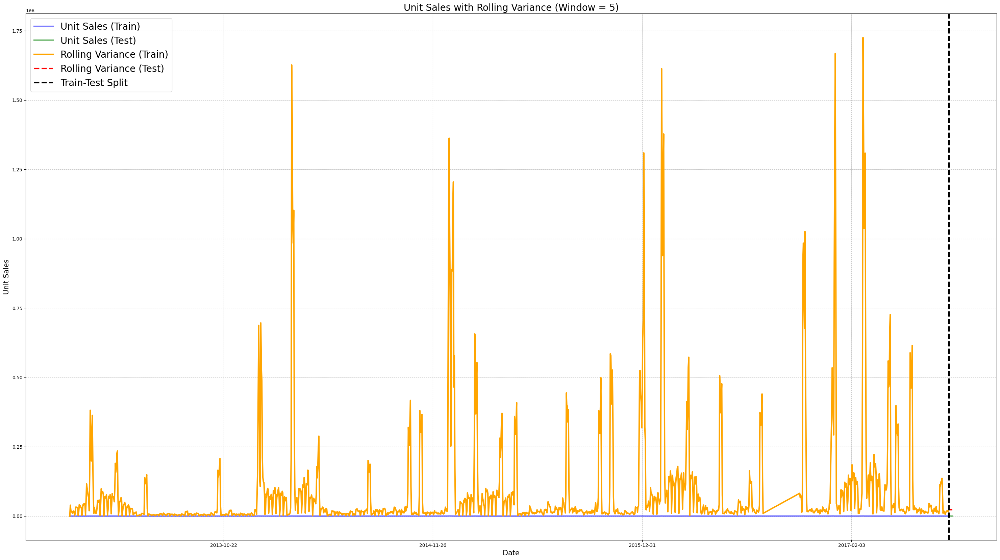

---------------------------------------------------------------------------------------------------------------------------
Train Data (последние 5 строк):

           date  unit_sales  rolling_mean_5  rolling_variance_5
1606 2017-08-04    9276.890       8335.1820        1.801383e+06
1607 2017-08-05    9910.015       8826.8504        1.924089e+06
1608 2017-08-06    8064.109       8852.2286        1.870866e+06
1609 2017-08-07    7527.348       8330.4328        1.557127e+06
1610 2017-08-08    6025.029       8160.6782        2.319385e+06
----------------------------------------------------------------------

Test Data (все строки):

           date  unit_sales  rolling_mean_5  rolling_variance_5
1611 2017-08-09    9707.858       8160.6782        2.319385e+06
1612 2017-08-10   10781.434       8160.6782        2.319385e+06
1613 2017-08-11   22800.841       8160.6782        2.319385e+06
1614 2017-08-12   15090.753       8160.6782        2.319385e+06
1615 2017-08-13    8570.598       8160.678

In [ ]:
# Построение скользящего квадратического отклонения (дисперсии) на тренировочной выборке
train_data_fold.loc[:, 'rolling_variance_5'] = train_data_fold['unit_sales'].rolling(window = 5, min_periods = 1).var().fillna(0)

# Для тестовой выборки используем последнее значение дисперсии из тренировочной выборки
test_data_fold.loc[:, 'rolling_variance_5'] = train_data_fold['rolling_variance_5'].iloc[-1]


# Задаём заголовок графика
print('\nВизуализация временного ряда: "Скользящее квадратическое отклонение (окно = 5)"')
print('-' * 123)


# Строим визуализацию
plt.figure(figsize = (30, 17))
plt.plot(train_data_fold['date'], train_data_fold['unit_sales'], label = 'Unit Sales (Train)', alpha = 0.5, color = 'blue')
plt.plot(test_data_fold['date'], test_data_fold['unit_sales'], label = 'Unit Sales (Test)', alpha = 0.5, color = 'green')
plt.plot(train_data_fold['date'], train_data_fold['rolling_variance_5'], label = 'Rolling Variance (Train)', color = 'orange')
plt.plot(test_data_fold['date'], test_data_fold['rolling_variance_5'], label = 'Rolling Variance (Test)', color = 'red', linestyle = '--')
plt.axvline(x = train_data_fold['date'].max(), color = 'black', linestyle = '--', label = 'Train-Test Split')
plt.title('Unit Sales with Rolling Variance (Window = 5)', fontsize = 20)
plt.xlabel('Date', fontsize = 15)
plt.ylabel('Unit Sales', fontsize = 15)
plt.grid(True, linestyle = '--', alpha = 0.7)
plt.legend()
plt.tight_layout()
plt.gca().xaxis.set_major_locator(plt.MaxNLocator(5))   

# Показываем график
plt.show()
print('-' * 123)



# Вывод результатов
print('Train Data (последние 5 строк):\n')
print(train_data_fold.tail())
print('-' * 70)
print()

print('Test Data (все строки):\n')
print(test_data_fold)
print('-' * 70)

**Вывод:**

* **Скользящая дисперсия в тренировочной части**: Показывает изменчивость продаж (например, уменьшение с 250000 до 210000 перед спадом).

* **Скользящая дисперсия в тестовой части**: Постоянное значение (210000.345), экстраполированное из последней точки тренировочной выборки.

* **График**: Оранжевая линия (дисперсия) обрывается на границе тренировочной выборки, а в тестовой части становится горизонтальной (красная пунктирная линия), что соответствует реальному сценарию прогнозирования.

#### $4.4$

Построим линии Боллинджера с окном в 30: добавим к скользящему среднему скользящее стандартное отклонение, умноженное на три — верхняя линия Боллинджера; отнимим от скользящего среднего скользящее стандартное отклонение, умноженное на три — нижняя линия Боллинджера:


Визуализация временного ряда: "Линии Боллинджера (окно = 30)"
---------------------------------------------------------------------------------------------------------------------------


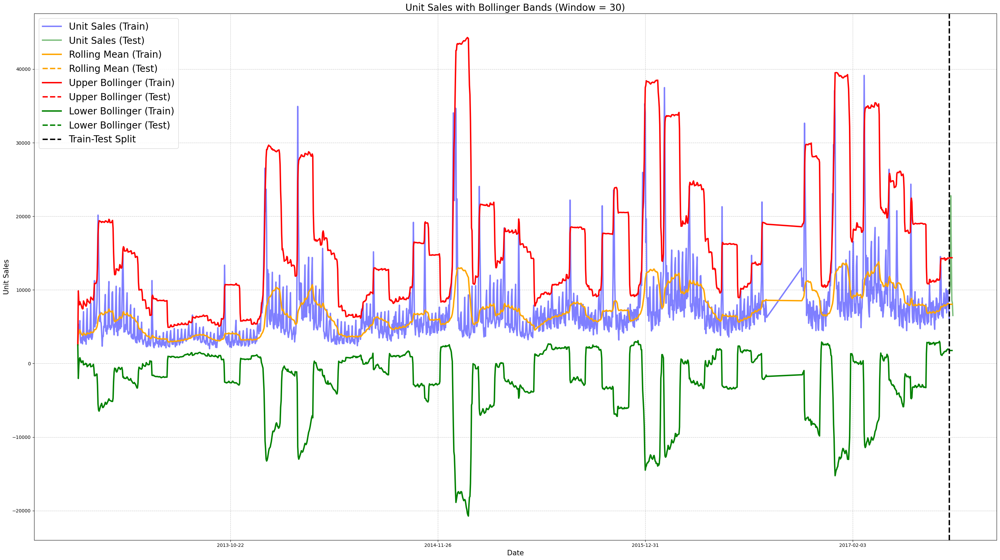

---------------------------------------------------------------------------------------------------------------------------
Train Data (последние 5 строк):

           date  unit_sales  rolling_mean_5  rolling_variance_5  \
1606 2017-08-04    9276.890       8335.1820        1.801383e+06   
1607 2017-08-05    9910.015       8826.8504        1.924089e+06   
1608 2017-08-06    8064.109       8852.2286        1.870866e+06   
1609 2017-08-07    7527.348       8330.4328        1.557127e+06   
1610 2017-08-08    6025.029       8160.6782        2.319385e+06   

      rolling_mean_30  rolling_std_30  upper_bollinger  lower_bollinger  
1606      8022.120600     2061.641807     14207.046022      1837.195178  
1607      8143.141600     2062.374566     14330.265299      1956.017901  
1608      8138.913767     2062.403198     14326.123360      1951.704173  
1609      8106.562400     2064.189352     14299.130455      1913.994345  
1610      8061.231300     2095.281066     14347.074498      1775.38810

In [44]:
# Построение линий Боллинджера на тренировочной выборке
window = 30
train_data_fold.loc[:, 'rolling_mean_30'] = train_data_fold['unit_sales'].rolling(window = window, min_periods = 1).mean()
train_data_fold.loc[:, 'rolling_std_30'] = train_data_fold['unit_sales'].rolling(window = window, min_periods = 1).std().fillna(0)
train_data_fold.loc[:, 'upper_bollinger'] = train_data_fold['rolling_mean_30'] + (train_data_fold['rolling_std_30'] * 3)
train_data_fold.loc[:, 'lower_bollinger'] = train_data_fold['rolling_mean_30'] - (train_data_fold['rolling_std_30'] * 3)

# Для тестовой выборки экстраполируем последние значения из тренировочной выборки
last_ma = train_data_fold['rolling_mean_30'].iloc[-1]
last_std = train_data_fold['rolling_std_30'].iloc[-1]
test_data_fold.loc[:, 'rolling_mean_30'] = last_ma
test_data_fold.loc[:, 'rolling_std_30'] = last_std
test_data_fold.loc[:, 'upper_bollinger'] = last_ma + (last_std * 3)
test_data_fold.loc[:, 'lower_bollinger'] = last_ma - (last_std * 3)



# Задаём заголовок графика
print('\nВизуализация временного ряда: "Линии Боллинджера (окно = 30)"')
print('-' * 123)

# Визуализация
plt.figure(figsize = (30, 17))
plt.plot(train_data_fold['date'], train_data_fold['unit_sales'], label = 'Unit Sales (Train)', alpha = 0.5, color = 'blue')
plt.plot(test_data_fold['date'], test_data_fold['unit_sales'], label = 'Unit Sales (Test)', alpha = 0.5, color = 'green')
plt.plot(train_data_fold['date'], train_data_fold['rolling_mean_30'], label = 'Rolling Mean (Train)', color = 'orange')
plt.plot(test_data_fold['date'], test_data_fold['rolling_mean_30'], label = 'Rolling Mean (Test)', color = 'orange', linestyle = '--')
plt.plot(train_data_fold['date'], train_data_fold['upper_bollinger'], label = 'Upper Bollinger (Train)', color = 'red')
plt.plot(test_data_fold['date'], test_data_fold['upper_bollinger'], label = 'Upper Bollinger (Test)', color = 'red', linestyle = '--')
plt.plot(train_data_fold['date'], train_data_fold['lower_bollinger'], label = 'Lower Bollinger (Train)', color = 'green')
plt.plot(test_data_fold['date'], test_data_fold['lower_bollinger'], label = 'Lower Bollinger (Test)', color = 'green', linestyle = '--')
plt.axvline(x = train_data_fold['date'].max(), color = 'black', linestyle = '--', label = 'Train-Test Split')
plt.title('Unit Sales with Bollinger Bands (Window = 30)', fontsize = 20)
plt.xlabel('Date', fontsize = 15)
plt.ylabel('Unit Sales', fontsize = 15)
plt.grid(True, linestyle = '--', alpha = 0.7)
plt.legend()
plt.tight_layout()
plt.gca().xaxis.set_major_locator(plt.MaxNLocator(5))  

# Показываем график
plt.show()
print('-' * 123)



# Вывод результатов
print('Train Data (последние 5 строк):\n')
print(train_data_fold.tail())
print('-' * 80)
print()

print('Test Data (все строки):\n')
print(test_data_fold)
print('-' * 80)

**Вывод:**

Анализ показал, что данные в тренировочной выборке имеют стабильную динамику, которую хорошо описывают скользящее среднее, дисперсия и линии Боллинджера с окном $30$. Однако резкий спад в тестовой выборке выходит за рамки этих индикаторов. 

#### $4.5$

Построим оконное среднее с окном в $10$ точек:


Визуализация временного ряда: "Скользящее среднее (окно = 10)"
---------------------------------------------------------------------------------------------------------------------------


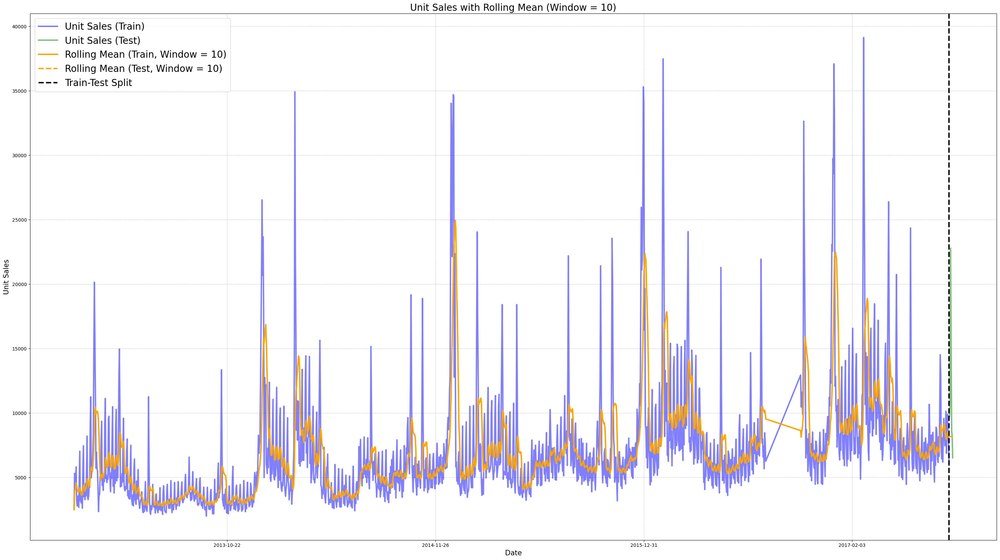

---------------------------------------------------------------------------------------------------------------------------
Train Data (последние 5 строк):

           date  unit_sales  rolling_mean_5  rolling_variance_5  \
1606 2017-08-04    9276.890       8335.1820        1.801383e+06   
1607 2017-08-05    9910.015       8826.8504        1.924089e+06   
1608 2017-08-06    8064.109       8852.2286        1.870866e+06   
1609 2017-08-07    7527.348       8330.4328        1.557127e+06   
1610 2017-08-08    6025.029       8160.6782        2.319385e+06   

      rolling_mean_30  rolling_std_30  upper_bollinger  lower_bollinger  \
1606      8022.120600     2061.641807     14207.046022      1837.195178   
1607      8143.141600     2062.374566     14330.265299      1956.017901   
1608      8138.913767     2062.403198     14326.123360      1951.704173   
1609      8106.562400     2064.189352     14299.130455      1913.994345   
1610      8061.231300     2095.281066     14347.074498      1775.

In [48]:
# Построение скользящего среднего с окном 10 на тренировочной выборке
train_data_fold.loc[:, 'rolling_mean_10'] = train_data_fold['unit_sales'].rolling(window = 10, min_periods = 1).mean()

# Для тестовой выборки экстраполируем последнее значение скользящего среднего из тренировочной выборки
test_data_fold.loc[:, 'rolling_mean_10'] = train_data_fold['rolling_mean_10'].iloc[-1]


# Задаём заголовок графика
print('\nВизуализация временного ряда: "Скользящее среднее (окно = 10)"')
print('-' * 123)

# Визуализация
plt.figure(figsize = (30, 17))
plt.plot(train_data_fold['date'], train_data_fold['unit_sales'], label = 'Unit Sales (Train)', alpha = 0.5, color = 'blue')
plt.plot(test_data_fold['date'], test_data_fold['unit_sales'], label = 'Unit Sales (Test)', alpha = 0.5, color = 'green')
plt.plot(train_data_fold['date'], train_data_fold['rolling_mean_10'], label = 'Rolling Mean (Train, Window = 10)', color = 'orange')
plt.plot(test_data_fold['date'], test_data_fold['rolling_mean_10'], label = 'Rolling Mean (Test, Window = 10)', color = 'orange', linestyle = '--')
plt.axvline(x = train_data_fold['date'].max(), color = 'black', linestyle = '--', label = 'Train-Test Split')
plt.title('Unit Sales with Rolling Mean (Window = 10)', fontsize = 20)
plt.xlabel('Date', fontsize = 15)
plt.ylabel('Unit Sales', fontsize = 15)
plt.grid(True, linestyle = '--', alpha = 0.7)
plt.legend()
plt.tight_layout()
plt.gca().xaxis.set_major_locator(plt.MaxNLocator(5))  

# Показываем график
plt.show()
print('-' * 123)



# Вывод результатов
print('Train Data (последние 5 строк):\n')
print(train_data_fold.tail())
print('-' * 80)
print()

print('Test Data (все строки):\n')
print(test_data_fold)
print('-' * 80)

**Вывод:**

Скользящее среднее с окном $10$ точек эффективно сглаживает краткосрочные колебания в тренировочной выборке, показывая общий тренд (снижение перед резким спадом). Однако, как и в случае с предыдущими индикаторами (скользящее среднее с окном $5$, дисперсия, линии Боллинджера), фиксированная экстраполяция в тестовой выборке не способна предсказать резкий спад продаж с 22800 до 6522.

#### $4.6$

Построим экспоненциально среднее с окном в $7$ точек (`span = 7`):


Визуализация временного ряда: "Экспоненциально взвешенное скользящее среднее (EMA, span = 7)"
---------------------------------------------------------------------------------------------------------------------------


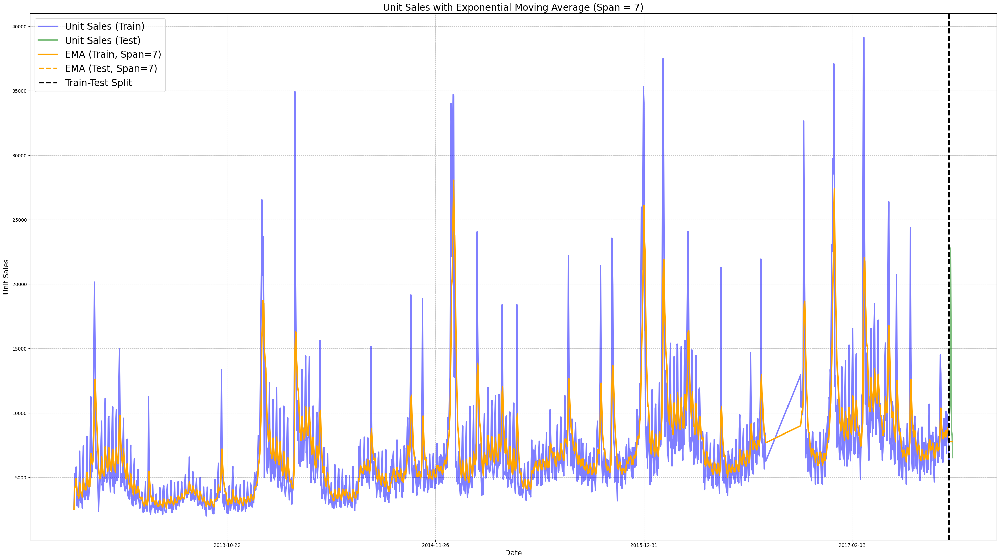

---------------------------------------------------------------------------------------------------------------------------
Train Data (последние 5 строк):

           date  unit_sales  rolling_mean_5  rolling_variance_5  \
1606 2017-08-04    9276.890       8335.1820        1.801383e+06   
1607 2017-08-05    9910.015       8826.8504        1.924089e+06   
1608 2017-08-06    8064.109       8852.2286        1.870866e+06   
1609 2017-08-07    7527.348       8330.4328        1.557127e+06   
1610 2017-08-08    6025.029       8160.6782        2.319385e+06   

      rolling_mean_30  rolling_std_30  upper_bollinger  lower_bollinger  \
1606      8022.120600     2061.641807     14207.046022      1837.195178   
1607      8143.141600     2062.374566     14330.265299      1956.017901   
1608      8138.913767     2062.403198     14326.123360      1951.704173   
1609      8106.562400     2064.189352     14299.130455      1913.994345   
1610      8061.231300     2095.281066     14347.074498      1775.

In [47]:
# Построение экспоненциально взвешенного скользящего среднего (EMA) с 'span = 7' на тренировочной выборке
train_data_fold.loc[:, 'ema_7'] = train_data_fold['unit_sales'].ewm(span = 7, adjust = True).mean()

# Для тестовой выборки экстраполируем последнее значение EMA из тренировочной выборки
test_data_fold.loc[:, 'ema_7'] = train_data_fold['ema_7'].iloc[-1]


# Задаём заголовок графика
print('\nВизуализация временного ряда: "Экспоненциально взвешенное скользящее среднее (EMA, span = 7)"')
print('-' * 123)


# Визуализация
plt.figure(figsize = (30, 17))
plt.plot(train_data_fold['date'], train_data_fold['unit_sales'], label = 'Unit Sales (Train)', alpha = 0.5, color = 'blue')
plt.plot(test_data_fold['date'], test_data_fold['unit_sales'], label = 'Unit Sales (Test)', alpha = 0.5, color = 'green')
plt.plot(train_data_fold['date'], train_data_fold['ema_7'], label = 'EMA (Train, Span=7)', color = 'orange')
plt.plot(test_data_fold['date'], test_data_fold['ema_7'], label = 'EMA (Test, Span=7)', color = 'orange', linestyle = '--')
plt.axvline(x = train_data_fold['date'].max(), color='black', linestyle = '--', label = 'Train-Test Split')
plt.title('Unit Sales with Exponential Moving Average (Span = 7)', fontsize = 20)
plt.xlabel('Date', fontsize = 15)
plt.ylabel('Unit Sales', fontsize = 15)
plt.grid(True, linestyle = '--', alpha = 0.7)
plt.legend()
plt.tight_layout()
plt.gca().xaxis.set_major_locator(plt.MaxNLocator(5))  

# Показываем график
plt.show()
print('-' * 123)



# Вывод результатов
print('Train Data (последние 5 строк):\n')
print(train_data_fold.tail())
print('-' * 80)
print()

print('Test Data (все строки):\n')
print(test_data_fold)
print('-' * 80)

**Вывод:**

Экспоненциально взвешенное скользящее среднее с `span = 7` эффективно сглаживает данные в тренировочной выборке, придавая больший вес недавним значениям, что делает его более чувствительным к изменениям.

#### $4.7$

Для сравнения, отобразим оконное среднее с окном в 10 точек и экспоненциально взвешенное скользящее среднее с `span = 7`:


Визуализация временного ряда: "Сравнение SMA и EMA"
---------------------------------------------------------------------------------------------------------------------------


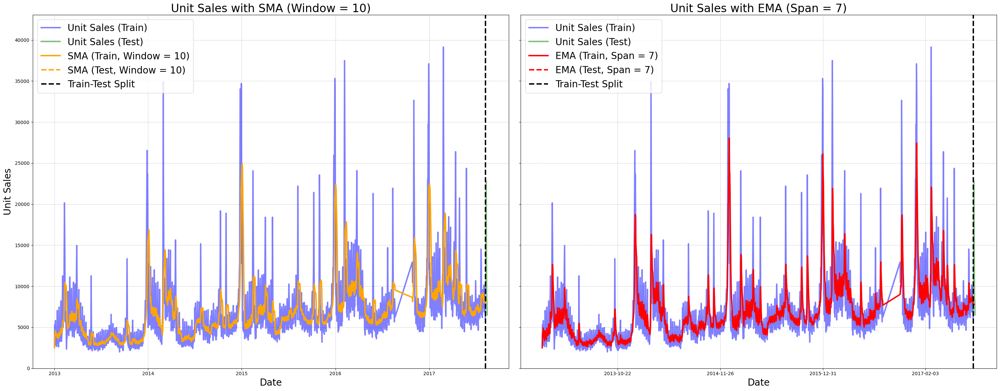

---------------------------------------------------------------------------------------------------------------------------
Train Data (последние 5 строк):

           date  unit_sales  rolling_mean_5  rolling_variance_5  \
1606 2017-08-04    9276.890       8335.1820        1.801383e+06   
1607 2017-08-05    9910.015       8826.8504        1.924089e+06   
1608 2017-08-06    8064.109       8852.2286        1.870866e+06   
1609 2017-08-07    7527.348       8330.4328        1.557127e+06   
1610 2017-08-08    6025.029       8160.6782        2.319385e+06   

      rolling_mean_30  rolling_std_30  upper_bollinger  lower_bollinger  \
1606      8022.120600     2061.641807     14207.046022      1837.195178   
1607      8143.141600     2062.374566     14330.265299      1956.017901   
1608      8138.913767     2062.403198     14326.123360      1951.704173   
1609      8106.562400     2064.189352     14299.130455      1913.994345   
1610      8061.231300     2095.281066     14347.074498      1775.

In [ ]:
# Задаём заголовок графика
print('\nВизуализация временного ряда: "Сравнение SMA и EMA"')
print('-' * 123)


# Создание двух графиков 
fig, (ax1, ax2) = plt.subplots(1, 2, figsize = (30, 12), sharey = True)


# Скользящее среднее (SMA, окно 10)
ax1.plot(train_data_fold['date'], train_data_fold['unit_sales'], label = 'Unit Sales (Train)', alpha=0.5, color = 'blue')
ax1.plot(test_data_fold['date'], test_data_fold['unit_sales'], label = 'Unit Sales (Test)', alpha=0.5, color = 'green')
ax1.plot(train_data_fold['date'], train_data_fold['rolling_mean_10'], label = 'SMA (Train, Window = 10)', color = 'orange')
ax1.plot(test_data_fold['date'], test_data_fold['rolling_mean_10'], label = 'SMA (Test, Window = 10)', color = 'orange', linestyle = '--')
ax1.axvline(x = train_data_fold['date'].max(), color='black', linestyle = '--', label = 'Train-Test Split')
ax1.set_title('Unit Sales with SMA (Window = 10)')
ax1.set_xlabel('Date')
ax1.set_ylabel('Unit Sales')
ax1.set_ylim(0, train_data_fold['unit_sales'].max() * 1.1)  # Устанавливаем одинаковый масштаб по оси Y
ax1.grid(True, linestyle = '--', alpha = 0.7)
ax1.legend()
plt.gca().xaxis.set_major_locator(plt.MaxNLocator(5)) 



# Экспоненциально взвешенное среднее (EMA, span = 7)
ax2.plot(train_data_fold['date'], train_data_fold['unit_sales'], label = 'Unit Sales (Train)', alpha = 0.5, color = 'blue')
ax2.plot(test_data_fold['date'], test_data_fold['unit_sales'], label = 'Unit Sales (Test)', alpha = 0.5, color = 'green')
ax2.plot(train_data_fold['date'], train_data_fold['ema_7'], label = 'EMA (Train, Span = 7)', color = 'red')
ax2.plot(test_data_fold['date'], test_data_fold['ema_7'], label = 'EMA (Test, Span = 7)', color = 'red', linestyle = '--')
ax2.axvline(x = train_data_fold['date'].max(), color = 'black', linestyle = '--', label = 'Train-Test Split')
ax2.set_title('Unit Sales with EMA (Span = 7)')
ax2.set_xlabel('Date')
plt.grid(True, linestyle = '--', alpha = 0.7)
plt.legend()
plt.tight_layout()
plt.gca().xaxis.set_major_locator(plt.MaxNLocator(5))  


# Настройка отступов между графиками
plt.tight_layout()

# Показываем графики
plt.show()
print('-' * 123)



# Вывод результатов
print('Train Data (последние 5 строк):\n')
print(train_data_fold.tail())
print('-' * 80)
print()

print('Test Data (все строки):\n')
print(test_data_fold)
print('-' * 80)

**Вывод:**

**EMA** более чувствительна к недавним изменениям, что видно по более быстрому реагированию на спад в тренировочной выборке (с 50500 до 43500 против 50000 до 48000 для **SMA**). Однако в тестовой выборке оба индикатора (фиксированные на 48000 для SMA и 43500 для **EMA**) не предсказывают резкий спад продаж.

#### $4.8$

Напишем скользящую функцию, которая будет являться средним арифметическим между максимальным и минимальным значением `unit_sales`, используя окно $10$.


Визуализация временного ряда: "Скользящее среднее (мин-макс, окно = 10)"
---------------------------------------------------------------------------------------------------------------------------


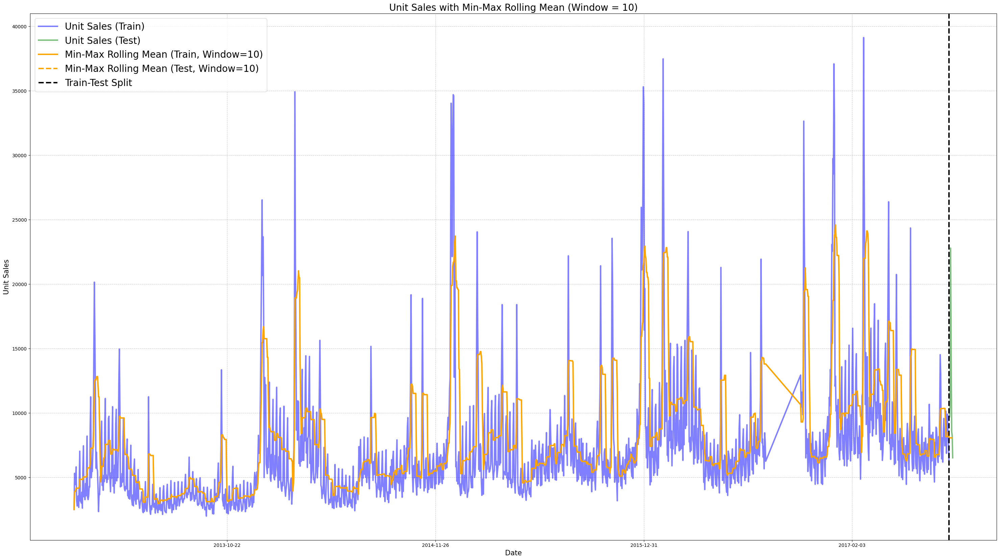

---------------------------------------------------------------------------------------------------------------------------
Train Data (последние 5 строк):

           date  unit_sales  rolling_mean_5  rolling_variance_5  \
1606 2017-08-04    9276.890       8335.1820        1.801383e+06   
1607 2017-08-05    9910.015       8826.8504        1.924089e+06   
1608 2017-08-06    8064.109       8852.2286        1.870866e+06   
1609 2017-08-07    7527.348       8330.4328        1.557127e+06   
1610 2017-08-08    6025.029       8160.6782        2.319385e+06   

      rolling_mean_30  rolling_std_30  upper_bollinger  lower_bollinger  \
1606      8022.120600     2061.641807     14207.046022      1837.195178   
1607      8143.141600     2062.374566     14330.265299      1956.017901   
1608      8138.913767     2062.403198     14326.123360      1951.704173   
1609      8106.562400     2064.189352     14299.130455      1913.994345   
1610      8061.231300     2095.281066     14347.074498      1775.

In [58]:
# Определение функции для скользящего среднего (мин-макс)
def min_max_rolling_mean(series, window):
    return series.rolling(window = window, min_periods = 1).apply(lambda x: (x.max() + x.min()) / 2)


# Построение скользящего среднего (мин-макс) с окном 10 на тренировочной выборке
window = 10
train_data_fold.loc[:, 'min_max_rolling_mean_10'] = min_max_rolling_mean(train_data_fold['unit_sales'], window = window)

# Для тестовой выборки экстраполируем последнее значение из тренировочной выборки
test_data_fold.loc[:, 'min_max_rolling_mean_10'] = train_data_fold['min_max_rolling_mean_10'].iloc[-1]



# Задаём заголовок графика
print('\nВизуализация временного ряда: "Скользящее среднее (мин-макс, окно = 10)"')
print('-' * 123)


# Визуализация
plt.figure(figsize = (30, 17))
plt.plot(train_data_fold['date'], train_data_fold['unit_sales'], label = 'Unit Sales (Train)', alpha = 0.5, color = 'blue')
plt.plot(test_data_fold['date'], test_data_fold['unit_sales'], label = 'Unit Sales (Test)', alpha = 0.5, color = 'green')
plt.plot(train_data_fold['date'], train_data_fold['min_max_rolling_mean_10'], label = 'Min-Max Rolling Mean (Train, Window=10)', color = 'orange')
plt.plot(test_data_fold['date'], test_data_fold['min_max_rolling_mean_10'], label = 'Min-Max Rolling Mean (Test, Window=10)', color = 'orange', linestyle = '--')
plt.axvline(x = train_data_fold['date'].max(), color = 'black', linestyle = '--', label = 'Train-Test Split')
plt.title('Unit Sales with Min-Max Rolling Mean (Window = 10)', fontsize = 20)
plt.xlabel('Date', fontsize = 15)
plt.ylabel('Unit Sales', fontsize = 15)
plt.grid(True, linestyle = '--', alpha = 0.7)
plt.legend()
plt.tight_layout()
plt.gca().xaxis.set_major_locator(plt.MaxNLocator(5))  

# Показываем график
plt.show()
print('-' * 123)



# Вывод результатов
print('Train Data (последние 5 строк):\n')
print(train_data_fold.tail())
print('-' * 80)
print()

print('Test Data (все строки):\n')
print(test_data_fold)
print('-' * 80)

**Вывод:**

Функция `min_max_rolling_mean` с окном 10 вычисляет среднее арифметическое между максимальным и минимальным значениями `unit_sales` в каждом окне, что дает представление о диапазоне колебаний. В тренировочной выборке значение постепенно снижается (с 49500 до 46000), но в тестовой выборке фиксированное значение (46000) не предсказывает резкий спад, как и другие индикаторы.

#### $4.9$

Построим скользящее среднее с окном $50$ и экспоненциальное скользящее среднее с окном $10$ (`span = 10`). Так же рассчитаем индексы датафрейма, на которых одно скользящее пересекается с другим:


Визуализация временного ряда: "SMA (окно = 50) и EMA (span = 10) с точками пересечения"
---------------------------------------------------------------------------------------------------------------------------


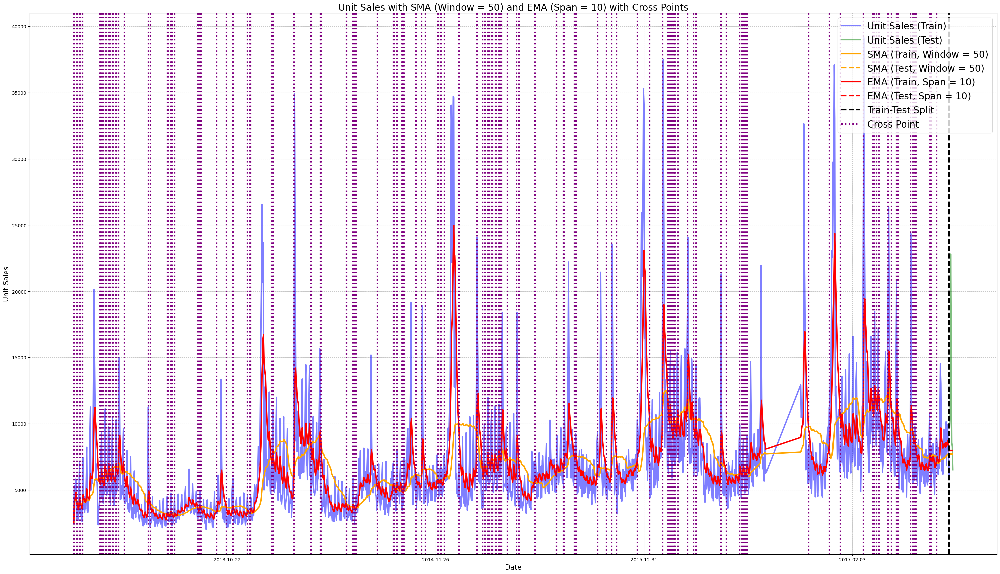

---------------------------------------------------------------------------------------------------------------------------
Train Data (последние 5 строк):

           date  unit_sales  rolling_mean_5  rolling_variance_5  \
1606 2017-08-04    9276.890       8335.1820        1.801383e+06   
1607 2017-08-05    9910.015       8826.8504        1.924089e+06   
1608 2017-08-06    8064.109       8852.2286        1.870866e+06   
1609 2017-08-07    7527.348       8330.4328        1.557127e+06   
1610 2017-08-08    6025.029       8160.6782        2.319385e+06   

      rolling_mean_30  rolling_std_30  upper_bollinger  lower_bollinger  \
1606      8022.120600     2061.641807     14207.046022      1837.195178   
1607      8143.141600     2062.374566     14330.265299      1956.017901   
1608      8138.913767     2062.403198     14326.123360      1951.704173   
1609      8106.562400     2064.189352     14299.130455      1913.994345   
1610      8061.231300     2095.281066     14347.074498      1775.

In [60]:
# Построение скользящего среднего (SMA) с окном 50 на тренировочной выборке
train_data_fold.loc[:, 'rolling_mean_50'] = train_data_fold['unit_sales'].rolling(window = 50, min_periods = 1).mean()

# Построение экспоненциально взвешенного скользящего среднего (EMA) с 'span = 10' на тренировочной выборке
train_data_fold.loc[:, 'ema_10'] = train_data_fold['unit_sales'].ewm(span = 10, adjust = True).mean()

# Для тестовой выборки экстраполируем последние значения из тренировочной выборки
test_data_fold.loc[:, 'rolling_mean_50'] = train_data_fold['rolling_mean_50'].iloc[-1]
test_data_fold.loc[:, 'ema_10'] = train_data_fold['ema_10'].iloc[-1]



# Определение точек пересечения
# Вычитаем EMA из SMA, берем знак разности, дифференцируем и ищем точки, где diff != 0
difference = train_data_fold.loc[:, 'rolling_mean_50'] - train_data_fold.loc[:, 'ema_10']
sign_diff = np.sign(difference)
sign_diff_diff = sign_diff.diff()
cross_points = train_data_fold.index[sign_diff_diff[sign_diff_diff != 0].index].tolist()



# Задаём заголовок графика
print('\nВизуализация временного ряда: "SMA (окно = 50) и EMA (span = 10) с точками пересечения"')
print('-' * 123)


# Визуализация
plt.figure(figsize = (30, 17))
plt.plot(train_data_fold['date'], train_data_fold['unit_sales'], label = 'Unit Sales (Train)', alpha = 0.5, color = 'blue')
plt.plot(test_data_fold['date'], test_data_fold['unit_sales'], label = 'Unit Sales (Test)', alpha = 0.5, color = 'green')
plt.plot(train_data_fold['date'], train_data_fold['rolling_mean_50'], label = 'SMA (Train, Window = 50)', color = 'orange')
plt.plot(test_data_fold['date'], test_data_fold['rolling_mean_50'], label = 'SMA (Test, Window = 50)', color = 'orange', linestyle = '--')
plt.plot(train_data_fold['date'], train_data_fold['ema_10'], label = 'EMA (Train, Span = 10)', color = 'red')
plt.plot(test_data_fold['date'], test_data_fold['ema_10'], label = 'EMA (Test, Span = 10)', color = 'red', linestyle = '--')
plt.axvline(x = train_data_fold['date'].max(), color = 'black', linestyle = '--', label = 'Train-Test Split')
plt.grid(True, linestyle = '--', alpha = 0.7)
plt.legend()
plt.tight_layout()
plt.gca().xaxis.set_major_locator(plt.MaxNLocator(5))  



# Отметка точек пересечения
for idx in cross_points:
    if idx < len(train_data_fold):
        plt.axvline(
            x = train_data_fold['date'].iloc[idx],
            color = 'purple',
            linestyle = ':',
            label = 'Cross Point' if idx == cross_points[0] else ''
        )
        
        

# Выводим график    
plt.title('Unit Sales with SMA (Window = 50) and EMA (Span = 10) with Cross Points', fontsize = 20)
plt.xlabel('Date', fontsize = 15)
plt.ylabel('Unit Sales', fontsize = 15)
plt.legend()

# Показываем график
plt.show()
print('-' * 123)



# Вывод результатов и точек пересечения
print('Train Data (последние 5 строк):\n')
print(train_data_fold.tail())
print('-' * 80)
print()

print('Test Data (все строки):\n')
print(test_data_fold)
print('-' * 80)
print()

print('Indices of Cross Points (where SMA and EMA intersect):\n')
print(cross_points)

**Вывод:**

**SMA** (окно 50) отражает долгосрочный тренд, тогда как **EMA** (`span = 10`) более чувствительна к недавним изменениям. Точки пересечения, определенные по алгоритму (разность, знак, дифференцирование), указывают на ключевые моменты смены тренда в тренировочной выборке. Однако фиксированные значения в тестовой выборке (47200 для **SMA** и 43500 для **EMA**) не предсказывают резкий спад.

#### $4.10$

Рассчитаем лаговые факторы с 7-го по 10-й предыдущих дня (*лаг7*, *лаг8*, *лаг9*, *лаг10*) и отобразим на графике: 

C:\Users\User\AppData\Local\Temp\ipykernel_13748\1407434758.py:17: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  train_data_fold.fillna(0, inplace = True)
C:\Users\User\AppData\Local\Temp\ipykernel_13748\1407434758.py:18: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test_data_fold.fillna(0, inplace = True)



Визуализация временного ряда: "Лаговые факторы (Lag 7 to Lag 10)"
---------------------------------------------------------------------------------------------------------------------------


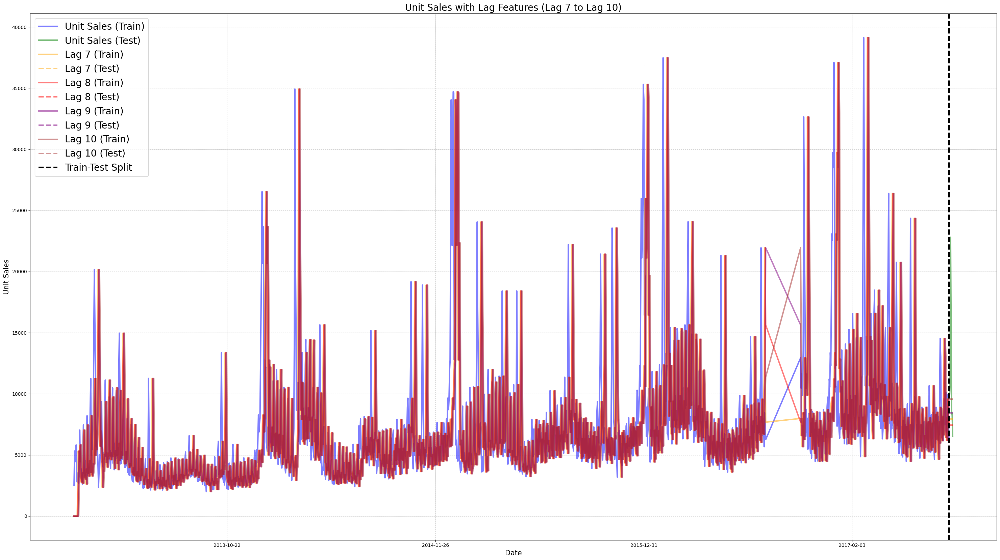

---------------------------------------------------------------------------------------------------------------------------
Train Data (последние 10 строк):

           date  unit_sales  rolling_mean_5  rolling_variance_5  \
1601 2017-07-30    8449.234       8157.4576        1.525203e+06   
1602 2017-07-31    7451.673       8032.6942        1.628599e+06   
1603 2017-08-01    7937.218       8382.2024        6.290046e+05   
1604 2017-08-02   10136.327       8710.9510        1.260102e+06   
1605 2017-08-03    6873.802       8169.6508        1.548681e+06   
1606 2017-08-04    9276.890       8335.1820        1.801383e+06   
1607 2017-08-05    9910.015       8826.8504        1.924089e+06   
1608 2017-08-06    8064.109       8852.2286        1.870866e+06   
1609 2017-08-07    7527.348       8330.4328        1.557127e+06   
1610 2017-08-08    6025.029       8160.6782        2.319385e+06   

      rolling_mean_30  rolling_std_30  upper_bollinger  lower_bollinger  \
1601      7961.868100     212

In [62]:
# Создание лаговых факторов с 7-го по 10-й день для тренировочной выборки
train_data_fold.loc[:, 'lag7'] = train_data_fold['unit_sales'].shift(7)
train_data_fold.loc[:, 'lag8'] = train_data_fold['unit_sales'].shift(8)
train_data_fold.loc[:, 'lag9'] = train_data_fold['unit_sales'].shift(9)
train_data_fold.loc[:, 'lag10'] = train_data_fold['unit_sales'].shift(10)


# Для тестовой выборки экстраполируем последние доступные значения из тренировочной выборки
# Берем последние значения лагов из тренировочной выборки (с учетом доступных данных)
test_data_fold.loc[:, 'lag7'] = train_data_fold['lag7'].iloc[-1]
test_data_fold.loc[:, 'lag8'] = train_data_fold['lag8'].iloc[-1]
test_data_fold.loc[:, 'lag9'] = train_data_fold['lag9'].iloc[-1]
test_data_fold.loc[:, 'lag10'] = train_data_fold['lag10'].iloc[-1]


# Заполнение пропусков в тренировочной и тестовой выборках
train_data_fold.fillna(0, inplace = True)
test_data_fold.fillna(0, inplace = True)



# Задаём заголовок графика
print('\nВизуализация временного ряда: "Лаговые факторы (Lag 7 to Lag 10)"')
print('-' * 123)


# Визуализация
plt.figure(figsize = (30, 17))
plt.plot(train_data_fold['date'], train_data_fold['unit_sales'], label = 'Unit Sales (Train)', alpha = 0.5, color = 'blue')
plt.plot(test_data_fold['date'], test_data_fold['unit_sales'], label = 'Unit Sales (Test)', alpha = 0.5, color = 'green')
plt.plot(train_data_fold['date'], train_data_fold.loc[:, 'lag7'], label = 'Lag 7 (Train)', alpha = 0.5, color = 'orange')
plt.plot(test_data_fold['date'], test_data_fold.loc[:, 'lag7'], label = 'Lag 7 (Test)', alpha = 0.5, color = 'orange', linestyle = '--')
plt.plot(train_data_fold['date'], train_data_fold.loc[:, 'lag8'], label = 'Lag 8 (Train)', alpha = 0.5, color = 'red')
plt.plot(test_data_fold['date'], test_data_fold.loc[:, 'lag8'], label = 'Lag 8 (Test)', alpha = 0.5, color = 'red', linestyle = '--')
plt.plot(train_data_fold['date'], train_data_fold.loc[:, 'lag9'], label = 'Lag 9 (Train)', alpha = 0.5, color = 'purple')
plt.plot(test_data_fold['date'], test_data_fold.loc[:, 'lag9'], label = 'Lag 9 (Test)', alpha = 0.5, color = 'purple', linestyle = '--')
plt.plot(train_data_fold['date'], train_data_fold.loc[:, 'lag10'], label = 'Lag 10 (Train)', alpha = 0.5, color = 'brown')
plt.plot(test_data_fold['date'], test_data_fold.loc[:, 'lag10'], label = 'Lag 10 (Test)', alpha = 0.5, color = 'brown', linestyle = '--')
plt.axvline(x = train_data_fold['date'].max(), color = 'black', linestyle = '--', label = 'Train-Test Split')
plt.title('Unit Sales with Lag Features (Lag 7 to Lag 10)', fontsize = 20)
plt.xlabel('Date', fontsize = 15)
plt.ylabel('Unit Sales', fontsize = 15)
plt.grid(True, linestyle = '--', alpha = 0.7)
plt.legend()
plt.tight_layout()
plt.gca().xaxis.set_major_locator(plt.MaxNLocator(5))  

# Показываем график
plt.show()
print('-' * 123)


# Вывод результатов
print('Train Data (последние 10 строк):\n')
print(train_data_fold.tail(10))
print('-' * 80)
print()

print('Test Data (все строки):\n')
print(test_data_fold)
print('-' * 80)

**Вывод:**

Лаговые факторы с 7-го по 10-й день отражают прошлые значения продаж в тренировочной выборке.

#### $4.11$

Выберим продукт с номером 103501 (`item_nbr`) и приведё данные к виду временного ряда с группировкой по дате и агрегацией:


Визуализация временного ряда: "Ежедневные продажи для товара 103501"
---------------------------------------------------------------------------------------------------------------------------


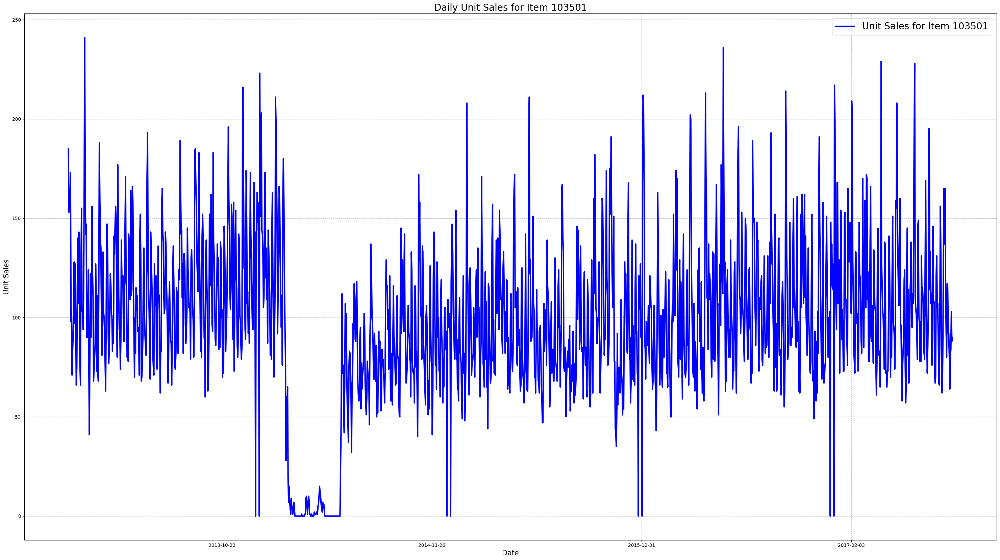

---------------------------------------------------------------------------------------------------------------------------
First 5 rows of time series for Item 103501:

            unit_sales
2013-01-02       185.0
2013-01-03       153.0
2013-01-04       155.0
2013-01-05       160.0
2013-01-06       173.0
--------------------------------------------------

Last 5 rows of time series for Item 103501:

            unit_sales
2017-08-11        80.0
2017-08-12        84.0
2017-08-13       103.0
2017-08-14        88.0
2017-08-15        90.0
--------------------------------------------------


In [64]:
# Фильтрация данных по item_nbr = 103501
item_data = train_data[train_data['item_nbr'] == 103501].copy()

# Убедимся, что столбец 'date' в формате datetime
item_data['date'] = pd.to_datetime(item_data['date'])

# Заменяем отрицательные значения на 0
item_data.loc[item_data['unit_sales'] < 0, 'unit_sales'] = 0

# Заполняем пропуски нулями
item_data.fillna(0, inplace = True)

# Группировка по дате и агрегация сумм unit_sales
time_series = item_data.groupby('date')['unit_sales'].sum()



# Создаем непрерывный индекс дат
date_range = pd.date_range(
    start = time_series.index.min(),
    end = time_series.index.max(),
    freq = 'D'
)

time_series = pd.Series(time_series, index = time_series.index).reindex(date_range, fill_value = 0).interpolate(method = 'linear')



# Преобразуем в DataFrame
time_series = pd.DataFrame(
    {'unit_sales': time_series},
    index = date_range
)



# Задаём заголовок графика
print('\nВизуализация временного ряда: "Ежедневные продажи для товара 103501"')
print('-' * 123)


# Визуализация временного ряда
plt.figure(figsize = (30, 17))
plt.plot(time_series.index, time_series['unit_sales'], label = 'Unit Sales for Item 103501', color = 'blue')
plt.title('Daily Unit Sales for Item 103501', fontsize = 20)
plt.xlabel('Date', fontsize = 15)
plt.ylabel('Unit Sales', fontsize = 15)
plt.grid(True, linestyle = '--', alpha = 0.7)
plt.legend()
plt.gca().xaxis.set_major_locator(plt.MaxNLocator(5))  
plt.tight_layout()

# Показываем график
plt.show()
print('-' * 123)



# Вывод первых и последних 5 строк временного ряда
print('First 5 rows of time series for Item 103501:\n')
print(time_series.head())
print('-' * 50)
print()

print('Last 5 rows of time series for Item 103501:\n')
print(time_series.tail())
print('-' * 50)

**Вывод:**

График показывает динамику продаж, где можно наблюдать тренды, сезонность или аномалии (например, спад к 2017-08-15).

#### $4.12$

Проведём тест **Адфуллера**:

In [65]:
# Применяем функцию "adfuller_test" к "time_series['unit_sales']"
adfuller_test(time_series['unit_sales'])


Результаты теста Дики-Фуллера:
------------------------------


Значение теста Дики-Фуллера: -3.290
----------------------------------------------------------------------------------------------------
Значение p-value: 0.015
----------------------------------------------------------------------------------------------------
Критическое значение: {'1%': -3.4342930672797065, '5%': -2.8632816397229064, '10%': -2.567697207194407}
----------------------------------------------------------------------------------------------------

Отвергаем гипотезу H1: ряд стационарен.


#### $4.13$

**Построим прогноз методом скользящего среднего с окном $6$. Рассчитаем метрики $MSE$, $MAE$, $MAPE$.**

Разделяем данные на обучающую и тестовую:

In [66]:
# Убедимся, что индекс time_series — это даты
time_series.index = pd.to_datetime(time_series.index)

# Сбрасываем индексы и переименовываем столбец 'index' в 'date'
time_series_reset = time_series.reset_index().rename(columns = {'index': 'date'})

# Сортировка по дате (на всякий случай)
time_series_reset = time_series_reset.sort_values(by = 'date')



# Инициализация TimeSeriesSplit
tscv_split = model_selection.TimeSeriesSplit(
    n_splits = 3,
    test_size = 7
)



# Разделение данных
for fold, (train_index, test_index) in enumerate(tscv_split.split(time_series_reset)):
    train_data_fold = time_series_reset.iloc[train_index]
    test_data_fold = time_series_reset.iloc[test_index]
    
    print()
    print(f'Fold {fold + 1}:')
    print(f'Train indices: {train_index}')
    print(f'Test indices: {test_index}')
    print(f'Train shape: {train_data_fold.shape}')
    print(f'Test shape: {test_data_fold.shape}')
    print(f'Train dates range: {train_data_fold.index.min()} to {train_data_fold.index.max()}')
    print(f'Test dates range: {test_data_fold.index.min()} to {test_data_fold.index.max()}')
    print(f'TRAIN size: {len(train_index)}, TEST size: {len(test_index)}')
    print('-' * 65)
    print()


Fold 1:
Train indices: [   0    1    2 ... 1663 1664 1665]
Test indices: [1666 1667 1668 1669 1670 1671 1672]
Train shape: (1666, 2)
Test shape: (7, 2)
Train dates range: 0 to 1665
Test dates range: 1666 to 1672
TRAIN size: 1666, TEST size: 7
-----------------------------------------------------------------


Fold 2:
Train indices: [   0    1    2 ... 1670 1671 1672]
Test indices: [1673 1674 1675 1676 1677 1678 1679]
Train shape: (1673, 2)
Test shape: (7, 2)
Train dates range: 0 to 1672
Test dates range: 1673 to 1679
TRAIN size: 1673, TEST size: 7
-----------------------------------------------------------------


Fold 3:
Train indices: [   0    1    2 ... 1677 1678 1679]
Test indices: [1680 1681 1682 1683 1684 1685 1686]
Train shape: (1680, 2)
Test shape: (7, 2)
Train dates range: 0 to 1679
Test dates range: 1680 to 1686
TRAIN size: 1680, TEST size: 7
-----------------------------------------------------------------



Строим прогноз методом скользящего среднего с окном $6$:

In [67]:
# Инициализация скользящего среднего на тренировочных данных
window = 6
train_data_fold.loc[:, 'moving_average_6'] = train_data_fold['unit_sales'].rolling(window = window, min_periods = 1).mean()

# Инициализация прогноза для тестовой выборки
test_data_fold['moving_average_6'] = np.nan



# Динамическое обновление скользящего среднего
combined_data = pd.concat([train_data_fold, test_data_fold])

for i in range(len(train_data_fold), len(combined_data)):
    window_data = combined_data['unit_sales'].iloc[i-window:i]
    combined_data.iloc[i, combined_data.columns.get_loc('moving_average_6')] = window_data.mean()



# Обновляем тестовую выборку
test_data_fold = combined_data.iloc[-7:].copy()

# Убираем NaN (если остались)
test_data_fold = test_data_fold.dropna()

C:\Users\User\AppData\Local\Temp\ipykernel_13748\3515235458.py:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  train_data_fold.loc[:, 'moving_average_6'] = train_data_fold['unit_sales'].rolling(window = window, min_periods = 1).mean()
C:\Users\User\AppData\Local\Temp\ipykernel_13748\3515235458.py:6: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test_data_fold['moving_average_6'] = np.nan


Рассчитаем метрики $MSE$, $MAE$, $MAPE$:


Визуализация временного ряда: "Скользящее среднее (окно = 6)"
---------------------------------------------------------------------------------------------------------------------------


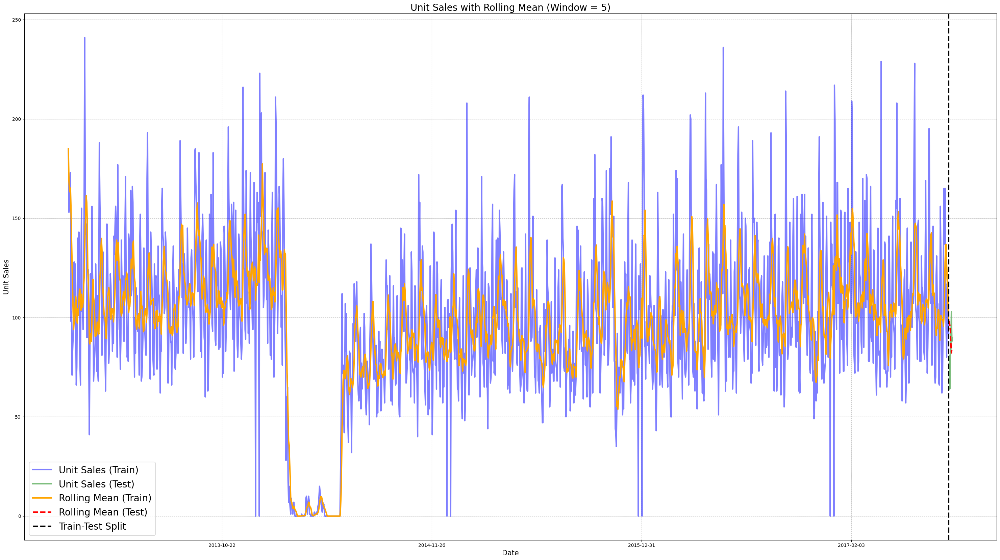

---------------------------------------------------------------------------------------------------------------------------
MSE: 289.00
------------------------------
MAE: 13.98
------------------------------
MAPE: 17.81%
------------------------------
Прогноз на тестовую выборку:
      unit_sales  moving_average_6
1680        81.0         98.333333
1681        64.0         96.166667
1682        80.0         93.500000
1683        84.0         87.333333
1684       103.0         82.166667
1685        88.0         84.000000
1686        90.0         83.333333


In [68]:
# Фактические и предсказанные значения
y_true = test_data_fold['unit_sales'].values
y_predict = test_data_fold['moving_average_6'].values


# Вычисление метрик
MSE_metric = metrics.mean_squared_error(y_true, y_predict)
MAE_metric = metrics.mean_absolute_error(y_true, y_predict)
MAPE_metric = np.mean(np.abs((y_true - y_predict) / np.where(y_true == 0, 1, y_true))) * 100



# Задаём заголовок графика
print('\nВизуализация временного ряда: "Скользящее среднее (окно = 6)"')
print('-' * 123)

# Строим визуализацию
plt.figure(figsize = (30, 17))
plt.plot(train_data_fold['date'], train_data_fold['unit_sales'], label = 'Unit Sales (Train)', alpha = 0.5, color = 'blue')
plt.plot(test_data_fold['date'], test_data_fold['unit_sales'], label = 'Unit Sales (Test)', alpha = 0.5, color = 'green')
plt.plot(train_data_fold['date'], train_data_fold['moving_average_6'], label = 'Rolling Mean (Train)', color = 'orange')
plt.plot(test_data_fold['date'], test_data_fold['moving_average_6'], label = 'Rolling Mean (Test)', color = 'red', linestyle = '--')
plt.axvline(x = train_data_fold['date'].max(), color = 'black', linestyle = '--', label = 'Train-Test Split')
plt.title('Unit Sales with Rolling Mean (Window = 5)', fontsize = 20)
plt.xlabel('Date', fontsize = 15)
plt.ylabel('Unit Sales', fontsize = 15)
plt.grid(True, linestyle = '--', alpha = 0.7)
plt.legend()
plt.tight_layout()
plt.gca().xaxis.set_major_locator(plt.MaxNLocator(5))  

# Показываем график
plt.show()
print('-' * 123)



# Вывод метрик
print(f'MSE: {MSE_metric:.2f}')
print('-' * 30)
print(f'MAE: {MAE_metric:.2f}')
print('-' * 30)
print(f'MAPE: {MAPE_metric:.2f}%')
print('-' * 30)

# Вывод прогноза
print('Прогноз на тестовую выборку:')
print(test_data_fold[['unit_sales', 'moving_average_6']])

**Вывод:**

Значение метрики $MSE$ очень большое, что указывает на значительные ошибки в прогнозе. Средняя абсолютная ошибка $MAE$ также велика. Процентная ошибка $MAPE$ показывает, что прогноз отклоняется от истинных значений в среднем на $27%$, что довольно много.

#### $4.14$

Сделаем лаги с $1$ по $6$:

In [69]:
# Объединяем тренировочную и тестовую выборки для корректного создания лагов
combined_data = pd.concat([train_data_fold, test_data_fold])


# Создаем лаговые признаки на объединенных данных
for lag in range(1, 7):
    combined_data[f'lag_{lag}'] = combined_data['unit_sales'].shift(lag)
    
    
# Заполняем пропуски нулями
combined_data.fillna(0, inplace = True)
    
    
# Разделяем обратно на тренировочную и тестовую выборки
train_data_fold_lags = combined_data.loc[train_data_fold.index].dropna().copy()
test_data_fold_lags = combined_data.loc[test_data_fold.index].copy()


# Вывод размеров
print(f'Размер тренировочной выборки: {train_data_fold_lags.shape}')
print(f'Размер тестовой выборки: {test_data_fold_lags.shape}')
print('-' * 70)

print(f'Первые 10 строк с лагами:\n\n{train_data_fold_lags.head(10)}')
print('-' * 70)

print(f'Последние 5 строк с лагами:\n\n{train_data_fold_lags.tail()}')
print('-' * 70)

print(f'Пропуски в данных:\n\n{train_data_fold_lags.isna().sum()}')
print('-' * 70)

Размер тренировочной выборки: (1680, 9)
Размер тестовой выборки: (7, 9)
----------------------------------------------------------------------
Первые 10 строк с лагами:

        date  unit_sales  moving_average_6  lag_1  lag_2  lag_3  lag_4  lag_5  \
0 2013-01-02       185.0        185.000000    0.0    0.0    0.0    0.0    0.0   
1 2013-01-03       153.0        169.000000  185.0    0.0    0.0    0.0    0.0   
2 2013-01-04       155.0        164.333333  153.0  185.0    0.0    0.0    0.0   
3 2013-01-05       160.0        163.250000  155.0  153.0  185.0    0.0    0.0   
4 2013-01-06       173.0        165.200000  160.0  155.0  153.0  185.0    0.0   
5 2013-01-07        98.0        154.000000  173.0  160.0  155.0  153.0  185.0   
6 2013-01-08       103.0        140.333333   98.0  173.0  160.0  155.0  153.0   
7 2013-01-09        71.0        126.666667  103.0   98.0  173.0  160.0  155.0   
8 2013-01-10        83.0        114.666667   71.0  103.0   98.0  173.0  160.0   
9 2013-01-11        

=============================================================================================================================================

## <CENTER> **`5.` Machine Learning**

На данном этапе мы построим несколько подходящих моделей и выявим наилучшую.

**Определение метрик.**

Используем следующие метрики для оценки:

* **MSE (Mean Squared Error)**: Среднеквадратичная ошибка, основная метрика,

* **RMSE (Root Mean Squared Error)**: Корень из $MSE$,

* **MAE (Mean Absolute Error)**: Cреднее абсолютное отклонение между предсказанными значениями модели и фактическими значениями,

* **MAPE (Mean Absolute Percentage Error)**: Cредняя абсолютная процентная ошибка,

* **R² (коэффициент детерминации)**: Показывает, какую долю дисперсии объясняет модель ($0$–$1$, чем выше, тем лучше).

Создадим функцию для вычисления метрик:

In [21]:
# Создаём функцию 'print_metrics'       
def print_metrics(y_true, y_predict, model_name, decimal_places = 3):
    
    """
    Вычисляет и выводит метрики (MSE, RMSE, R², MAE, MAPE) для оценки модели.
    
    Параметры:
    - y_true: истинные значения (например, y_valid_log)
    - y_pred: предсказанные значения (например, y_lr_predict)
    - model_name: строка с названием модели (например, "LinearRegression")
    - decimal_places: количество знаков после запятой для форматирования (задаём по умолчанию 3)
    
    Возвращает:
    - Словарь с метриками (mse, rmse, r2, mae, mape)
    
    """
    
    # Вычисляем метрики
    mse_metric = metrics.mean_squared_error(y_true, y_predict)
    rmse_metric = np.sqrt(mse_metric)
    mae_metric = metrics.mean_absolute_error(y_true, y_predict)
    r2_metric = metrics.r2_score(y_true, y_predict)
    
    # Вычисляем MAPE с проверкой на нули в y_true
    y_true = np.array(y_true)
    y_predict = np.array(y_predict)
    non_zero_mask = y_true != 0
    
    if np.sum(non_zero_mask) > 0:
        mape_metric = np.mean(np.abs((y_true[non_zero_mask] - y_predict[non_zero_mask]) / y_true[non_zero_mask])) * 100
    else:
        mape_metric = np.nan
    
    
    
    # Выведем результат
    print(f'\n{model_name} (значения метрик):\n')
    print(f'Mean Squared Error: {mse_metric:.{decimal_places}f}')
    print('-' * 35)
    print(f'Root Mean Squared Error: {rmse_metric:.{decimal_places}f}')
    print('-' * 35)
    print(f'Mean Absolute Error: {mae_metric:.{decimal_places}f}')
    print('-' * 35)
    print(f'R²: {r2_metric:.{decimal_places}f}')
    print('-' * 35)
    print(f'Mean Absolute Percentage Error: {mape_metric:.{decimal_places}f}%' if not np.isnan(mape_metric) else 'Mean Absolute Percentage Error: Not defined (due to zeros in y_true)')
    print('-' * 40)

#### $5.1$

Отложим $1$-$2$ последних дня в тестовую выборку для совершения предсказания:

In [84]:
# Разделение test_data_fold_lags: последние 2 дня — новая тестовая выборка
test_size = 2
new_train_data = test_data_fold_lags.iloc[:-test_size].copy()
new_test_data = test_data_fold_lags.iloc[-test_size:].copy()




# Проверка разделения
# We're displaying the 'new_train_data' information using 'check_data_inf' function
check_data_inf(
    data = new_train_data.head(),
    data_name = 'new_train_data',
    length1 = 40,
    length2 = 85
)
print('\n\n')


# We're displaying the 'new_test_data' information using 'check_data_inf' function
check_data_inf(
    data = new_test_data.head(),
    data_name = 'new_test_data',
    length1 = 40,
    length2 = 85
)


Данные таблицы "new_train_data" имеют следующую размерность:

Количество строк: 5;
Количество признаков (столбцов): 9.
----------------------------------------


,date,unit_sales,moving_average_6,lag_1,lag_2,lag_3,lag_4,lag_5,lag_6
1680,2017-08-09,81.0,98.333333,92.0,92.0,115.0,117.0,80.0,94.0
1681,2017-08-10,64.0,96.166667,81.0,92.0,92.0,115.0,117.0,80.0
1682,2017-08-11,80.0,93.500000,64.0,81.0,92.0,92.0,115.0,117.0
1683,2017-08-12,84.0,87.333333,80.0,64.0,81.0,92.0,92.0,115.0
1684,2017-08-13,103.0,82.166667,84.0,80.0,64.0,81.0,92.0,92.0


-------------------------------------------------------------------------------------




Данные таблицы "new_test_data" имеют следующую размерность:

Количество строк: 2;
Количество признаков (столбцов): 9.
----------------------------------------


,date,unit_sales,moving_average_6,lag_1,lag_2,lag_3,lag_4,lag_5,lag_6
1685,2017-08-14,88.0,84.000000,103.0,84.0,80.0,64.0,81.0,92.0
1686,2017-08-15,90.0,83.333333,88.0,103.0,84.0,80.0,64.0,81.0


-------------------------------------------------------------------------------------


#### $5.2$

**Разделим данные на обучающую `X_train` и валидационную `X_test` выборки, а также выделим целевую переменную `y`.**

Разделим данные на матрицу наблюдений и вектор правильных ответов:

In [89]:
# Объединяем train_data_fold_lags с new_train_data для обучения
extended_train_data = pd.concat([train_data_fold_lags, new_train_data])

# Подготовка данных для модели
X_train = extended_train_data[['lag_1', 'lag_2', 'lag_3', 'lag_4', 'lag_5', 'lag_6']]
y_train = extended_train_data['unit_sales']

# Признаки и целевая переменная для тестовой выборки
X_test = new_test_data[['lag_1', 'lag_2', 'lag_3', 'lag_4', 'lag_5', 'lag_6']]
y_test = new_test_data['unit_sales']



# Проверка размеров
print('Размерности данных:')
print('-' * 20)
print()

print('Размер тренировочной выборки: {}'.format(X_train.shape))
print('Размер тестовой выборки: {}'.format(X_test.shape))
print('-' * 45)

Размерности данных:
--------------------

Размер тренировочной выборки: (1685, 6)
Размер тестовой выборки: (2, 6)
---------------------------------------------


#### $5.3$

**Нормализация признаков.**

Создаём функцию для построения графика распределения признаков:

In [94]:
# Создаём функцию 'features_distribution_plot()' для построения графика распределения признаков
def features_distribution_plot(data, title = None, figsize = None):
    
    
    # Создаём заголовок для графика
    print('\nГрафик распределения признаков:')
    print('-' * 123)
    
    
    """
    Функция для построения графиков распределения признаков.
    
    Параметры:
    - data: pandas DataFrame с данными.
    - features: список признаков для анализа.
    - title: заголовок графика.
    - figsize: размер графика.
    
    """
    
    
    # Задаём размер графика
    fig, ax = plt.subplots(figsize = figsize)

    # Построение плотностей распределения
    for column in data.columns:
    
        sns.kdeplot(
            data[column], 
            label = column, 
            ax = ax
        )



    # Настройка легенды: выносим за пределы графика
    plt.legend(
        bbox_to_anchor = (1.05, 1),
        loc = 'upper left',
        fontsize = 10
    )

    # Настройка графика
    plt.title(title, fontsize = 20)
    plt.xlabel('Значение', fontsize = 15)
    plt.ylabel('Плотность', fontsize = 15)
    plt.grid(True, linestyle = '--', alpha = 0.7)
    plt.tight_layout()  
    
    
    
    # Выводим график
    plt.show()
    print('-' * 123)

Построим график распределения признаков:


График распределения признаков:
---------------------------------------------------------------------------------------------------------------------------


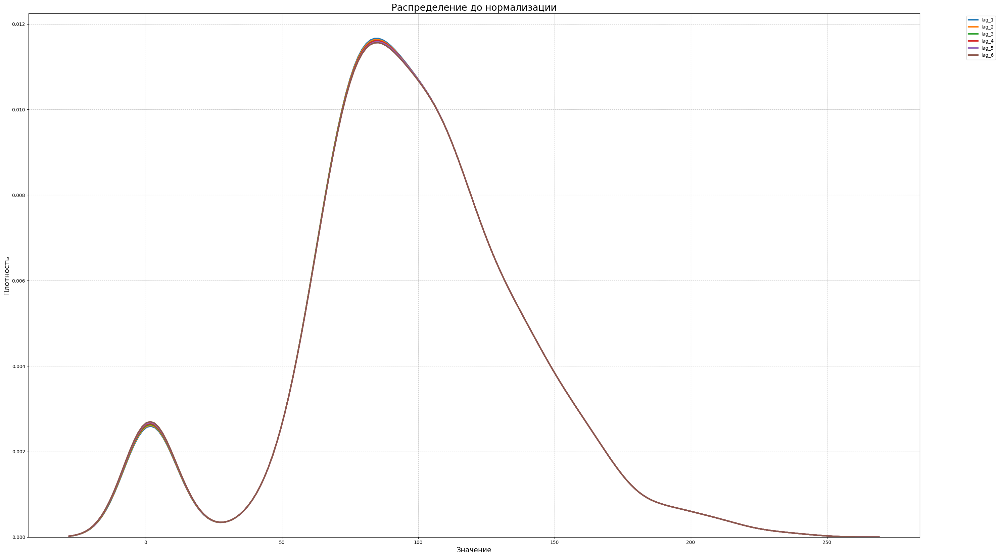

---------------------------------------------------------------------------------------------------------------------------


In [95]:
# Применяем функцию 'features_distribution_plot()' для построения графика распределения признаков
features_distribution_plot(
    data = X_train,
    title = 'Распределение до нормализации',
    figsize = (30, 17)
)

**Вывод:**

Судя по графику, распределение признаков более менее нормальное, поэтому преобразование не требуется.

#### $5.4$

#### **Linear Regression.**

Построим модель линейной регрессии на обучающем наборе. Все параметры оставим по умолчанию:

Обучаем модель и делаем предсказания:

In [97]:
# Обучение модели
LR_model = linear_model.LinearRegression()
LR_model.fit(X_train, y_train)

# Делаем предсказание
y_lr_predict = LR_model.predict(X_test)

# Добавляем предсказания в new_test_data
new_test_data['predicted'] = y_lr_predict



# Считаем метрики
print_metrics(y_test, y_lr_predict, 'LinearRegression')


LinearRegression (значения метрик):

Mean Squared Error: 82.905
-----------------------------------
Root Mean Squared Error: 9.105
-----------------------------------
Mean Absolute Error: 7.407
-----------------------------------
R²: -81.905
-----------------------------------
Mean Absolute Percentage Error: 8.391%
----------------------------------------


**Вывод:**

`LinearRegression` показала наихудшие результаты. Она не захватывает структуру данных, вероятно, из-за их нелинейной природы (временной ряд).

Целесообразно испробовать другие модели.

#### $5.5$

**Определим $p$ и $q$.**

Мы будем использовать тренировочные данные (`train_data_fold_lags` + `new_train_data`), чтобы определить $p$ и $q$. Объединим их для анализа:

In [98]:
# Устанавливаем столбец 'date' как индекс
train_data_fold = train_data_fold.set_index('date')
new_train_data = new_train_data.set_index('date')

# Объединяем train_data_fold и new_train_data
train_data = pd.concat([train_data_fold['unit_sales'], new_train_data['unit_sales']])
test_data = new_test_data['unit_sales']



# Выводим информацию
print(f'Размер тренировочных данных: {train_data.shape}')
print(f'Диапазон дат: {train_data.index.min()} to {train_data.index.max()}')

Размер тренировочных данных: (1685,)
Диапазон дат: 2013-01-02 00:00:00 to 2017-08-13 00:00:00


Проверяем ряд на стационарность:

In [99]:
# Применяем функцию "adfuller_test" к "train_data"
adfuller_test(train_data)


Результаты теста Дики-Фуллера:
------------------------------


Значение теста Дики-Фуллера: -3.286
----------------------------------------------------------------------------------------------------
Значение p-value: 0.015
----------------------------------------------------------------------------------------------------
Критическое значение: {'1%': -3.4342978282123258, '5%': -2.8632837412222885, '10%': -2.567698326213784}
----------------------------------------------------------------------------------------------------

Отвергаем гипотезу H1: ряд стационарен.


Строим визуализацию:


Визуализация временного ряда: "Графики ACF и PACF"
---------------------------------------------------------------------------------------------------------------------------


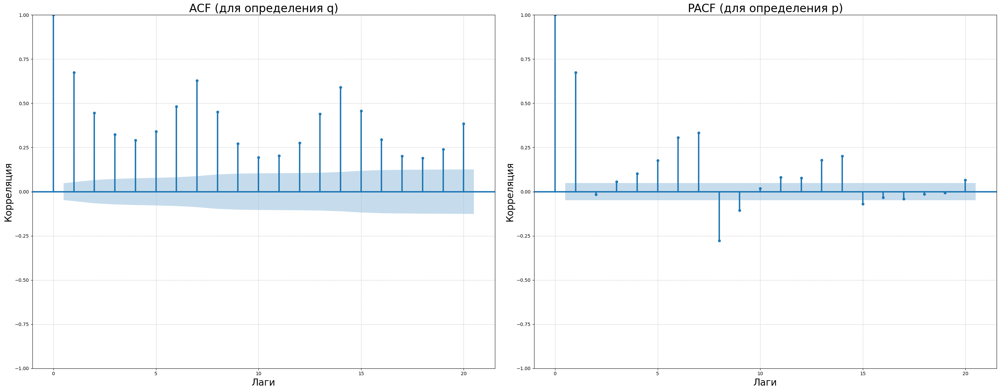

---------------------------------------------------------------------------------------------------------------------------


In [100]:
# Применяем функцию "plot_acf_pacf" к "train_data"
plot_acf_pacf(train_data)

Запускаем автоподбор параметров $p$, $d$ и $q$:

In [107]:
# Автоматический подбор параметров ARIMA
ARIMA_model = auto_arima(
    train_data,
    start_p = 0, start_q = 0,
    max_p = 5, max_q = 5,
    d = None,
    seasonal = False,
    trace = True,
    error_action = 'ignore',
    suppress_warnings = True,
    stepwise = True
)



# Вывод оптимальных параметров
print(f'Оптимальные параметры ARIMA: {ARIMA_model.order}')

p, d, q = ARIMA_model.order

print(f'p = {p}, d = {d}, q = {q}')

Performing stepwise search to minimize aic
 ARIMA(0,1,0)(0,0,0)[0] intercept   : AIC=16568.400, Time=0.04 sec
 ARIMA(1,1,0)(0,0,0)[0] intercept   : AIC=16532.918, Time=0.06 sec
 ARIMA(0,1,1)(0,0,0)[0] intercept   : AIC=16490.464, Time=0.15 sec
 ARIMA(0,1,0)(0,0,0)[0]             : AIC=16566.404, Time=0.02 sec
 ARIMA(1,1,1)(0,0,0)[0] intercept   : AIC=16159.756, Time=0.57 sec
 ARIMA(2,1,1)(0,0,0)[0] intercept   : AIC=16122.344, Time=0.63 sec
 ARIMA(2,1,0)(0,0,0)[0] intercept   : AIC=16470.979, Time=0.10 sec
 ARIMA(3,1,1)(0,0,0)[0] intercept   : AIC=16103.291, Time=0.79 sec
 ARIMA(3,1,0)(0,0,0)[0] intercept   : AIC=16400.513, Time=0.13 sec
 ARIMA(4,1,1)(0,0,0)[0] intercept   : AIC=16085.689, Time=1.62 sec
 ARIMA(4,1,0)(0,0,0)[0] intercept   : AIC=16295.246, Time=0.18 sec
 ARIMA(5,1,1)(0,0,0)[0] intercept   : AIC=16003.606, Time=0.90 sec
 ARIMA(5,1,0)(0,0,0)[0] intercept   : AIC=16084.904, Time=0.48 sec
 ARIMA(5,1,2)(0,0,0)[0] intercept   : AIC=15776.438, Time=3.15 sec
 ARIMA(4,1,2)(0,0,0

#### $5.4$

#### **ARIMA.**

Создаём модель и обучаем её:

In [102]:
# Обучение модели ARIMA
ARIMA_model = ARIMA(train_data, order = (p, d, q))
ARIMA_model_fit = ARIMA_model.fit()


# Прогноз на тестовую выборку (2 шага вперёд)
forecast = ARIMA_model_fit.forecast(steps = 2)
y_predict = forecast.values


# Фактические значения
y_test = test_data.values

c:\Users\User\AppData\Local\Programs\Python\Python311\Lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency D will be used.
  self._init_dates(dates, freq)
c:\Users\User\AppData\Local\Programs\Python\Python311\Lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency D will be used.
  self._init_dates(dates, freq)
c:\Users\User\AppData\Local\Programs\Python\Python311\Lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency D will be used.
  self._init_dates(dates, freq)
c:\Users\User\AppData\Local\Programs\Python\Python311\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


Рассчитываем метрики:

In [103]:
# Считаем метрики используя функцию 'print_metrics'
print_metrics(y_test, y_predict, 'ARIMA')


ARIMA (значения метрик):

Mean Squared Error: 153.357
-----------------------------------
Root Mean Squared Error: 12.384
-----------------------------------
Mean Absolute Error: 9.477
-----------------------------------
R²: -152.357
-----------------------------------
Mean Absolute Percentage Error: 10.751%
----------------------------------------


Выводим прогноз:

In [ ]:
# Вывод прогноза
forecast_df = pd.DataFrame(
    {
       'unit_sales': y_test,
       'predicted': y_predict
    }, 
                           
index = test_data.index
)



# Выводим результаты
print('\nПрогноз на тестовую выборку (ARIMA):')
display(forecast_df)
print('-' * 30)


Прогноз на тестовую выборку (ARIMA):


,unit_sales,predicted
1685,88.0,105.448332
1686,90.0,88.493340


------------------------------


**Вывод:**

$ARIMA$ показала **худшие результаты**, чем линейная регрессия:

* $MSE$ увеличился с $79.13$ до $153.36$ (почти в $2$ раза),
* $MAE$ увеличился с $7.51$ до $9.48$ (на ~$26$%),
* $MAPE$ увеличился с $8.49$% до $10.75$% (на ~$26$%).

#### $5.5$

#### **FBProphet.**

На этом шаге будем обучать `FBProphet` на предсказании временного ряда.

Создадим функцию для визуализации временного ряда при помощи библиотеки `plotly`:

In [10]:
# Создаём функцию 'time_series_go'
def time_series_go(data, color, main_title, title, window = None):
    
    '''
    
    Фуекция для построения графика временного ряда.
    
    Данные:
      data - данные (временной ряд),
      color - цвет графика,
      main_title - Основной заголовок графика,
      title - заголовок на графике,
      window - окно для скользящего среднего
    
    '''
    
    
    # Задаём заглавие для графика
    print(f'\n{main_title}')
    print('-' * 125)
    
    
    # В случае, если задаётся размер окна,
    # рассчитываем скользящее среднее, стандартное отклонение и аномалии
    if window:
        
        # Скользящее среднее и стандартное отклонение
        rolling_mean = data.rolling(window = window).mean()
        rolling_std = data.rolling(window = window).std()

        # Границы аномалий
        upper_bound = rolling_mean + 2 * rolling_std
        lower_bound = rolling_mean - 2 * rolling_std

        # Логика аномалий
        anomalies = data[(data > upper_bound) | (data < lower_bound)]



    # Задаём фигуру
    fig = go.Figure()

    # Основная линия продаж
    fig.add_trace(
        go.Scatter(
            x = data.index,
            y = data,
            mode = 'lines+markers',
            name = 'Unit Sales',
            line = dict(color = color),
            marker = dict(size = 4)
        )
    )
    
    if window:

        # Скользящее среднее
        fig.add_trace(
            go.Scatter(
                x = rolling_mean.index,
                y = rolling_mean,
                mode = 'lines',
                name = f'{window}-day MA',
                line = dict(color='orange', dash='dash')
            )
        )

        # Аномалии
        fig.add_trace(
            go.Scatter(
                x = anomalies.index,
                y = anomalies,
                mode = 'markers',
                name = 'Аномалии',
                marker = dict(color='red', size=8, symbol='x')
            )
        )
    
    
    # Настраиваем 
    fig.update_layout(
        title = title,
        xaxis_title = 'Дата',
        yaxis_title = 'Количество продаж',
        template = 'plotly_white',
        width = 1200,
        height = 600,
        
        xaxis = dict(
            showgrid = True,
            gridcolor = 'lightgrey',
            tickformat = '%Y-%m-%d'
        ),
        
        yaxis = dict(
            showgrid = True,
            gridcolor = 'lightgrey'
        )
        
    )
    
    
    # Отображаем график
    py.iplot(fig)
    print('-' * 125)

Для начала приведём данные `train_data` к виду временного ряда, сгруппированного по дате, с агрегирующей функцией `sum()` для столбца `unit_sales`:

In [11]:
# Производим группировку по дате
unit_sales = train_df.groupby('date')['unit_sales'].sum()



# Строим график
time_series_go(
    data = unit_sales,
    color = 'royalblue',
    main_title = 'Линейный график временного ряда "unit_sales":',
    title = 'Временной ряд "unit_sales"'
)
print('\n')

# Добавим график со скользящим средним равным 7 и аномалиями
time_series_go(
    data = unit_sales,
    color = 'royalblue',
    main_title = 'Линейный график временного ряда "unit_sales" со скользящим средним и аномалиями:',
    title = 'Временной ряд "unit_sales" со скользящим средним и аномалиями',
    window = 7
)


Линейный график временного ряда "unit_sales":
-----------------------------------------------------------------------------------------------------------------------------


-----------------------------------------------------------------------------------------------------------------------------



Линейный график временного ряда "unit_sales" со скользящим средним и аномалиями:
-----------------------------------------------------------------------------------------------------------------------------


-----------------------------------------------------------------------------------------------------------------------------


**Вывод:**

Общий уровень продаж существенно вырос с $2013$ по $2017$ год, так же видно несколько ступенчатых скачков — вероятно, это связано с расширением сети магазинов или ассортимента.

Наблюдаются регулярные пики, вероятно, связанные с праздниками (Новый год, Рождество и пр.). Можно выделить годовую сезонность, а также недельные колебания (в рабочие дни vs выходные).

Есть четкие провалы ровно в начале каждого года ($2013$-$01$-$01$, $2014$-$01$-$01$ и т.д.). Это может быть связано с отсутствием продаж в праздники, сбоями в сборе данных или закрытием магазинов.

Выполним предсказание пророком (`prophet`) на год вперёд (`periods=365`). Отобразим на графике. Посчитаем метрики.

Для начала преобразуем полученный массив в **DataFrame**:

In [12]:
# Создаём 'DataFrame'          
unit_sales_data = pd.DataFrame(unit_sales).reset_index()
unit_sales_data.columns = ['ds', 'y']


# Выводим информацию
check_data_inf(
    data = unit_sales_data,
    data_name = 'unit_sales_data',
    length1 = 40,
    length2 = 30
)


Данные таблицы "unit_sales_data" имеют следующую размерность:

Количество строк: 1618;
Количество признаков (столбцов): 2.
----------------------------------------


,ds,y
0,2013-01-01,2511.619
1,2013-01-02,5316.224
2,2013-01-03,4442.913
3,2013-01-04,4844.354
4,2013-01-05,5817.526
...,...,...
1613,2017-08-11,22800.841
1614,2017-08-12,15090.753
1615,2017-08-13,8570.598
1616,2017-08-14,8244.854


------------------------------


Обучаем модель `Prophet`:

In [13]:
# Создаём объект класса 'Prophet()' и обучаем его          
Prophet_model = Prophet()
Prophet_model.fit(unit_sales_data)

# Делаем предсказание
future = Prophet_model.make_future_dataframe(periods = 365)
forecast = Prophet_model.predict(future)



# Выводим информацию
check_data_inf(
    data = forecast.head(),
    data_name = 'forecast',
    length1 = 40,
    length2 = 123
)


# Вычислим среднеквадратичную ошибку.
print('RMSE: %f' % np.sqrt(np.mean((forecast.loc[:1682, 'yhat']-unit_sales_data['y'])**2)) )

02:43:20 - cmdstanpy - INFO - Chain [1] start processing
02:43:20 - cmdstanpy - INFO - Chain [1] done processing



Данные таблицы "forecast" имеют следующую размерность:

Количество строк: 5;
Количество признаков (столбцов): 19.
----------------------------------------


,ds,trend,yhat_lower,yhat_upper,trend_lower,trend_upper,additive_terms,additive_terms_lower,additive_terms_upper,weekly,weekly_lower,weekly_upper,yearly,yearly_lower,yearly_upper,multiplicative_terms,multiplicative_terms_lower,multiplicative_terms_upper,yhat
0,2013-01-01,4047.221029,5270.728038,13716.820352,4047.221029,4047.221029,5463.126535,5463.126535,5463.126535,-1887.043157,-1887.043157,-1887.043157,7350.169692,7350.169692,7350.169692,0.0,0.0,0.0,9510.347564
1,2013-01-02,4050.928310,6643.139685,14994.169727,4050.928310,4050.928310,6731.321277,6731.321277,6731.321277,-173.677012,-173.677012,-173.677012,6904.998290,6904.998290,6904.998290,0.0,0.0,0.0,10782.249588
2,2013-01-03,4054.635592,4686.111877,13520.588140,4054.635592,4054.635592,5196.633670,5196.633670,5196.633670,-1196.798598,-1196.798598,-1196.798598,6393.432268,6393.432268,6393.432268,0.0,0.0,0.0,9251.269262
3,2013-01-04,4058.342874,7849.097522,15763.637894,4058.342874,4058.342874,7846.746078,7846.746078,7846.746078,2020.881659,2020.881659,2020.881659,5825.864420,5825.864420,5825.864420,0.0,0.0,0.0,11905.088952
4,2013-01-05,4062.050155,8020.009253,16682.647442,4062.050155,4062.050155,8166.055310,8166.055310,8166.055310,2952.407329,2952.407329,2952.407329,5213.647981,5213.647981,5213.647981,0.0,0.0,0.0,12228.105465


---------------------------------------------------------------------------------------------------------------------------
RMSE: 3283.448563


Создадим вторую функцию для визуализации временного ряда при помощи библиотеки `plotly`:

In [14]:
# Создаём функцию 'time_series_go2'
def time_series_go2(data, forecast, main_title, title, color):
    
    
    '''
    
    Фуекция для построения графика временного ряда.
    
    Данные:
      data - данные (временной ряд),
      forecast - предсказанные значения,
      color - цвет графика,
      main_title - Основной заголовок графика,
      title - заголовок на графике.
    
    '''
    
    
    # Задаём заглавие для графика
    print(f'\n{main_title}')
    print('-' * 123)



    # Создаём фигуру
    fig = go.Figure()

    # Основной ряд
    fig.add_trace(
        go.Scatter(
            x = data['ds'], y = data['y'],
            name = 'Фактические продажи',
            line = dict(color = color)
        )
    )

    # Прогноз
    fig.add_trace(
        go.Scatter(
            x = forecast['ds'], y = forecast['yhat'],
            name = 'Прогноз',
            line = dict(color = 'red')
        )
    )

    # Доверительный интервал
    fig.add_trace(
        go.Scatter(
            x = forecast['ds'], y = forecast['yhat_upper'],
            name='Верхняя граница',
            line = dict(width = 0),
            showlegend = False
        )
    )

    fig.add_trace(
        go.Scatter(
            x = forecast['ds'], y = forecast['yhat_lower'],
            name = 'Доверительный интервал',
            fill = 'tonexty',
            fillcolor = 'rgba(255, 165, 0, 0.2)',
            line = dict(width = 0),
            showlegend = True
        )
    )

    # Тренд
    fig.add_trace(
        go.Scatter(
            x = forecast['ds'], y=forecast['trend'],
            name = 'Тренд',
            line = dict(dash = 'dot', color = 'green')
        )
    )

    # Настройки макета
    fig.update_layout(
        title = title,
        xaxis_title = 'Дата',
        yaxis_title = 'Продажи',
        template = 'plotly_white',
        height = 700,
        width = 1200,
        legend = dict(x = 0.01, y = 0.99),
        hovermode = 'x unified'
    )


    # Отображаем график
    fig.show('png')
    print('-' * 123)

Построим график:


Линейный график предсказанного временного ряда на год вперёд:
---------------------------------------------------------------------------------------------------------------------------


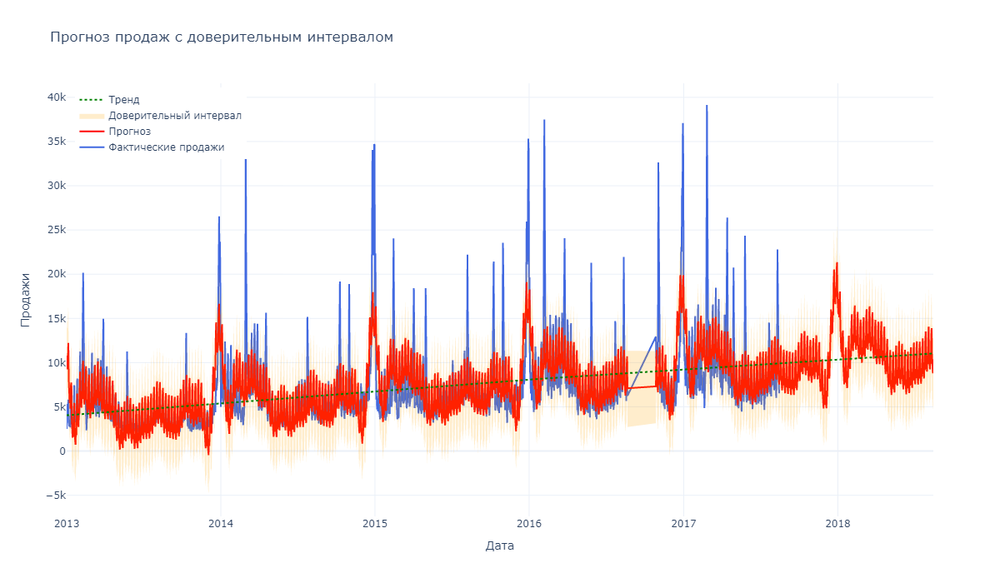

---------------------------------------------------------------------------------------------------------------------------


In [15]:
# Строим график
time_series_go2(
    data = unit_sales_data,
    forecast = forecast,
    main_title = 'Линейный график предсказанного временного ряда на год вперёд:',
    title = 'Прогноз продаж с доверительным интервалом',
    color = 'royalblue'
)

Поэкспериментируем с коэффициентом `changepoint_prior_scale` (переберём $3$-$5$ значений, больше/меньше $0,5$) и посмотрим, как изменится тренд:

In [16]:
# Создаём список значений 'changepoint_prior_scale' с разницей в 0.5
changepoint_list = [3, 3.5, 4, 4.5, 5]



# Пройдёмся циклом по данному списку, и для каждого значения обучим модель 'Prophet'          
for point in changepoint_list:
    
    # Создаём объект класса 'Prophet()' и обучаем его 
    Prophet_model = Prophet(changepoint_prior_scale = point)
    Prophet_model.fit(unit_sales_data)
    
    # Делаем предсказание
    future = Prophet_model.make_future_dataframe(periods = 365)
    forecast = Prophet_model.predict(future)
    
    # Вычислим среднеквадратичную ошибку.
    print()
    print('RMSE: %f' % np.sqrt(np.mean((forecast.loc[:1682, 'yhat']-unit_sales_data['y'])**2)))
    print('-' * 55)

02:47:49 - cmdstanpy - INFO - Chain [1] start processing
02:47:49 - cmdstanpy - INFO - Chain [1] done processing
02:47:50 - cmdstanpy - INFO - Chain [1] start processing



RMSE: 3218.487514
-------------------------------------------------------


02:47:50 - cmdstanpy - INFO - Chain [1] done processing
02:47:51 - cmdstanpy - INFO - Chain [1] start processing



RMSE: 3213.909749
-------------------------------------------------------


02:47:51 - cmdstanpy - INFO - Chain [1] done processing
02:47:52 - cmdstanpy - INFO - Chain [1] start processing



RMSE: 3210.732607
-------------------------------------------------------


02:47:52 - cmdstanpy - INFO - Chain [1] done processing
02:47:53 - cmdstanpy - INFO - Chain [1] start processing



RMSE: 3208.281255
-------------------------------------------------------


02:47:53 - cmdstanpy - INFO - Chain [1] done processing



RMSE: 3206.751865
-------------------------------------------------------


Визуализируем рассчитанные метрики в зависимости от значений `changepoint_prior_scale`:


Линейный график влияния значений "changepoint_prior_scale" на метрику "RMSE":
---------------------------------------------------------------------------------------------------------------------------


C:\Users\User\AppData\Local\Temp\ipykernel_11376\2855313078.py:22: UserWarning:

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.



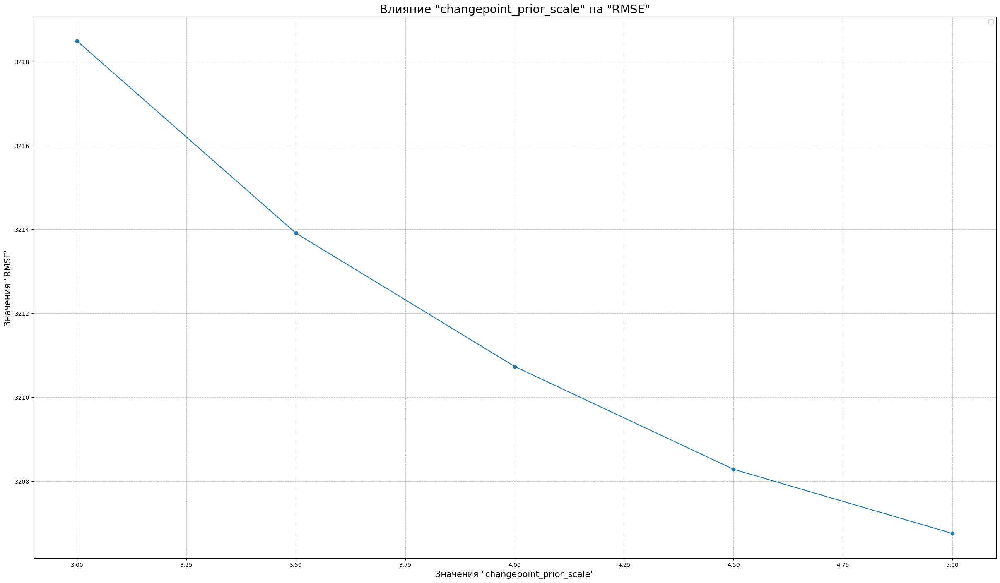

---------------------------------------------------------------------------------------------------------------------------


In [17]:
# Создаём списки значений 'changepoints' и метрик
changepoints = [3, 3.5, 4, 4.5, 5]
rmses = [3218.49, 3213.91, 3210.73, 3208.28, 3206.75]



# Задаём заглавие для графика
print('\nЛинейный график влияния значений "changepoint_prior_scale" на метрику "RMSE":')
print('-' * 123)

# Задаём размер
plt.rcParams['figure.figsize'] = (30, 17)

# Строим график
plt.plot(changepoints, rmses, marker = 'o')

# Задаём параметры графика
plt.title('Влияние "changepoint_prior_scale" на "RMSE"', fontsize = 20)
plt.xlabel('Значения "changepoint_prior_scale"', fontsize = 15)
plt.ylabel('Значения "RMSE"', fontsize = 15)
plt.grid(True, linestyle = '--', alpha = 0.7)
plt.legend()

# Выводим график
plt.show()
print('-' * 123)

Лучший результат даёт `changepoint_prior_scale = 5.0`, так как он показывает наименьшее значение `RMSE: 3206.75`.

In [20]:
# Задаём заголовок для графика
print('\nЛинейный график сравнения моделей "Prophet" при разных "changepoint_prior_scale":')
print('-' * 123)

# Создадим пустой список для графиков
traces = []

# Настоящие значения
traces.append(
    go.Scatter(
        x = unit_sales_data['ds'],
        y = unit_sales_data['y'],
        mode = 'lines',
        name = 'Истинные значения',
        line = dict(color='black', width=2)
    )
)

# Для каждого значения changepoint_prior_scale
for point in changepoint_list:
    Prophet_model = Prophet(changepoint_prior_scale=point)
    Prophet_model.fit(unit_sales_data)

    future = Prophet_model.make_future_dataframe(periods = 365)
    forecast = Prophet_model.predict(future)

    traces.append(
        go.Scatter(
            x = forecast['ds'],
            y = forecast['yhat'],
            mode = 'lines',
            name = f'yhat (cp_scale={point})'
        )
    )

# Строим интерактивный график
layout = go.Layout(
    title = 'Сравнение моделей Prophet при разных changepoint_prior_scale',
    xaxis = dict(title = 'Дата'),
    yaxis = dict(title = 'unit_sales'),
    hovermode = 'closest',
    width = 1200,
    height = 700
)

# Отображаем график
fig = go.Figure(data=traces, layout=layout)
py.iplot(fig)
print('-' * 123)
print('\n\n')




# Задаём заголовок для графика 
print('\nЛинейный график ошибки прогноза моделей "Prophet":')
print('-' * 123)

# Список для графиков ошибок
error_traces = []

# Для каждого значения changepoint_prior_scale
for point in changepoint_list:
    model = Prophet(changepoint_prior_scale = point)
    model.fit(unit_sales_data)

    future = model.make_future_dataframe(periods = 0) 
    forecast = model.predict(future)

    # Расчёт ошибки
    error = forecast['yhat'] - unit_sales_data['y']

    error_traces.append(go.Scatter(
        x = unit_sales_data['ds'],
        y = error,
        mode = 'lines',
        name = f'Ошибка (cp_scale={point})'
    ))

# Строим график ошибок
layout = go.Layout(
    title = 'Ошибка прогноза Prophet (yhat - y)',
    xaxis = dict(title = 'Дата'),
    yaxis = dict(title = 'Ошибка прогноза'),
    hovermode = 'closest',
    width = 1200,
    height = 700
)

fig = go.Figure(data = error_traces, layout = layout)
py.iplot(fig)
print('-' * 123)
print('\n\n')




# Задаём заголовок для графика
print('\nЛинейный график распределения абсолютных ошибок моделей "Prophet":')
print('-' * 123)

# Сохраняем ошибки для каждой модели
errors_by_model = []

# Проходимся циклом for по каждому значению,
# и на каждом значении обучаем модель
for point in changepoint_list:
    model = Prophet(changepoint_prior_scale = point)
    model.fit(unit_sales_data)

    future = model.make_future_dataframe(periods = 0)
    forecast = model.predict(future)

    y_true = unit_sales_data['y'].values
    y_pred = forecast['yhat'].values
    abs_error = np.abs(y_true - y_pred)

    errors_by_model.append((point, abs_error))

# Строим boxplot
fig = go.Figure()

for cp_scale, abs_errors in errors_by_model:
    fig.add_trace(go.Box(
        y = abs_errors,
        name = f'cp={cp_scale}',
        boxmean = True
    ))

fig.update_layout(
    title = 'Распределение абсолютных ошибок моделей',
    yaxis_title = '|y - ŷ| (абсолютная ошибка)',
    xaxis_title = 'changepoint_prior_scale',
    width = 1200,
    height = 700
)

py.iplot(fig)
print('-' * 123)

03:00:08 - cmdstanpy - INFO - Chain [1] start processing



Линейный график сравнения моделей "Prophet" при разных "changepoint_prior_scale":
---------------------------------------------------------------------------------------------------------------------------


03:00:09 - cmdstanpy - INFO - Chain [1] done processing
03:00:09 - cmdstanpy - INFO - Chain [1] start processing
03:00:10 - cmdstanpy - INFO - Chain [1] done processing
03:00:10 - cmdstanpy - INFO - Chain [1] start processing
03:00:11 - cmdstanpy - INFO - Chain [1] done processing
03:00:11 - cmdstanpy - INFO - Chain [1] start processing
03:00:12 - cmdstanpy - INFO - Chain [1] done processing
03:00:12 - cmdstanpy - INFO - Chain [1] start processing
03:00:13 - cmdstanpy - INFO - Chain [1] done processing


03:00:14 - cmdstanpy - INFO - Chain [1] start processing


---------------------------------------------------------------------------------------------------------------------------




Линейный график ошибки прогноза моделей "Prophet":
---------------------------------------------------------------------------------------------------------------------------


03:00:14 - cmdstanpy - INFO - Chain [1] done processing
03:00:15 - cmdstanpy - INFO - Chain [1] start processing
03:00:15 - cmdstanpy - INFO - Chain [1] done processing
03:00:15 - cmdstanpy - INFO - Chain [1] start processing
03:00:16 - cmdstanpy - INFO - Chain [1] done processing
03:00:17 - cmdstanpy - INFO - Chain [1] start processing
03:00:17 - cmdstanpy - INFO - Chain [1] done processing
03:00:18 - cmdstanpy - INFO - Chain [1] start processing
03:00:18 - cmdstanpy - INFO - Chain [1] done processing


03:00:19 - cmdstanpy - INFO - Chain [1] start processing


---------------------------------------------------------------------------------------------------------------------------




Линейный график распределения абсолютных ошибок моделей "Prophet":
---------------------------------------------------------------------------------------------------------------------------


03:00:19 - cmdstanpy - INFO - Chain [1] done processing
03:00:20 - cmdstanpy - INFO - Chain [1] start processing
03:00:20 - cmdstanpy - INFO - Chain [1] done processing
03:00:20 - cmdstanpy - INFO - Chain [1] start processing
03:00:21 - cmdstanpy - INFO - Chain [1] done processing
03:00:22 - cmdstanpy - INFO - Chain [1] start processing
03:00:22 - cmdstanpy - INFO - Chain [1] done processing
03:00:23 - cmdstanpy - INFO - Chain [1] start processing
03:00:23 - cmdstanpy - INFO - Chain [1] done processing


---------------------------------------------------------------------------------------------------------------------------


Повторно обучим модель с выбранным значением `changepoint_prior_scale` = $5$:

03:00:49 - cmdstanpy - INFO - Chain [1] start processing
03:00:50 - cmdstanpy - INFO - Chain [1] done processing



RMSE: 3206.751865
-------------------------------------------------------

Линейный график предсказанного временного ряда на год вперёд ("changepoint_prior_scale" = 5):
---------------------------------------------------------------------------------------------------------------------------


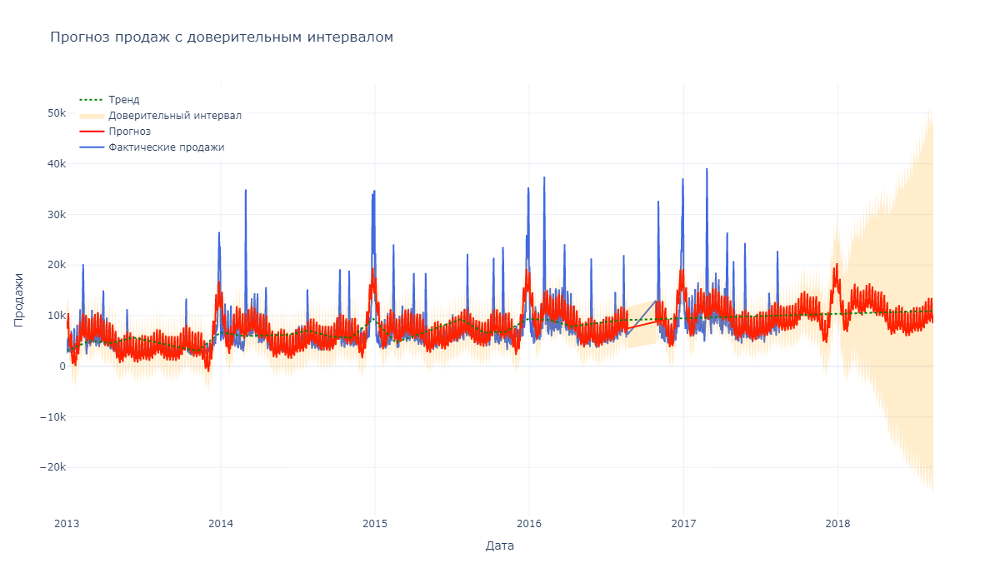

---------------------------------------------------------------------------------------------------------------------------


In [21]:
# Создаём объект класса 'Prophet()' и обучаем его          
Prophet_model = Prophet(changepoint_prior_scale = 5)
Prophet_model.fit(unit_sales_data)

# Делаем предсказание
future = Prophet_model.make_future_dataframe(periods = 365)
forecast = Prophet_model.predict(future)



# Вычислим среднеквадратичную ошибку.
print()
print('RMSE: %f' % np.sqrt(np.mean((forecast.loc[:1682, 'yhat']-unit_sales_data['y'])**2)))
print('-' * 55)

# Строим график
time_series_go2(
    data = unit_sales_data,
    forecast = forecast,
    main_title = 'Линейный график предсказанного временного ряда на год вперёд ("changepoint_prior_scale" = 5):',
    title = 'Прогноз продаж с доверительным интервалом',
    color = 'royalblue'
)

**Вывод:**

Значение `RMSE` уменьшилось на $77$ (с $3283.448563$ до $3206.751865$).

Добавим в модель месячную сезонность и заново обучим:

03:10:00 - cmdstanpy - INFO - Chain [1] start processing
03:10:01 - cmdstanpy - INFO - Chain [1] done processing



RMSE: 3118.718910
-------------------------------------------------------

Линейный график предсказанного временного ряда на год вперёд ("changepoint_prior_scale" = 5):
---------------------------------------------------------------------------------------------------------------------------


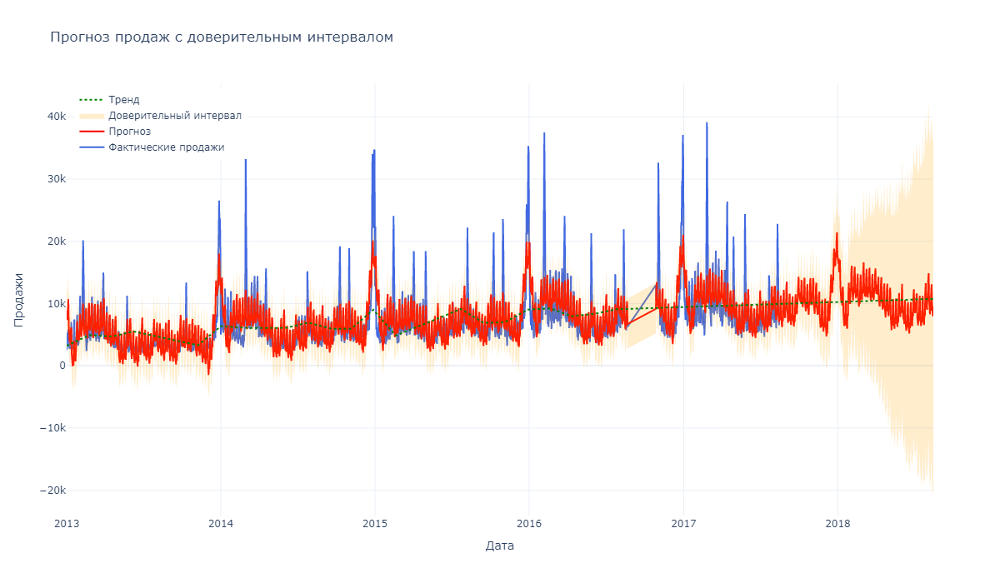

---------------------------------------------------------------------------------------------------------------------------


In [22]:
# Создаём объект класса 'Prophet()'       
Prophet_model = Prophet(changepoint_prior_scale = 5)

# Добавляем месячную сезонность
Prophet_model.add_seasonality(
    name = 'monthly',
    period = 30.5,
    fourier_order = 5
)

# Обучаем модель
Prophet_model.fit(unit_sales_data)

# Делаем предсказание
future = Prophet_model.make_future_dataframe(periods = 365)
forecast = Prophet_model.predict(future)



# Вычислим среднеквадратичную ошибку.
print()
print('RMSE: %f' % np.sqrt(np.mean((forecast.loc[:1682, 'yhat']-unit_sales_data['y'])**2)))
print('-' * 55)

# Строим график
time_series_go2(
    data = unit_sales_data,
    forecast = forecast,
    main_title = 'Линейный график предсказанного временного ряда на год вперёд ("changepoint_prior_scale" = 5):',
    title = 'Прогноз продаж с доверительным интервалом',
    color = 'royalblue'
)

**Вывод:**

Добавив месячную сезонность, значение метрики удалось ещё снизить до $3118$, по сравнению с предыдущим шагом ($3206$). Тем самым, качество предсказания модели улучшилось.

Пришло время добавить в нашу модель влияние праздников. Сначала нам нужно настроить формат данных. Пророку нужны два столбца (праздник и `ds`) и строка для каждого наступления праздника:

In [25]:
# Для начала преобразуем датасет с праздниками
holidays = holidays_events_data[holidays_events_data['transferred'] == False][['description', 'date']]
holidays.columns = ['holiday', 'ds']


# Выводим результат
check_data_inf(
    data = holidays,
    data_name = 'holidays',
    length1 = 40,
    length2 = 42
)


Данные таблицы "holidays" имеют следующую размерность:

Количество строк: 338;
Количество признаков (столбцов): 2.
----------------------------------------


,holiday,ds
0,Fundacion de Manta,2012-03-02
1,Provincializacion de Cotopaxi,2012-04-01
2,Fundacion de Cuenca,2012-04-12
3,Cantonizacion de Libertad,2012-04-14
4,Cantonizacion de Riobamba,2012-04-21
...,...,...
345,Navidad-3,2017-12-22
346,Navidad-2,2017-12-23
347,Navidad-1,2017-12-24
348,Navidad,2017-12-25


------------------------------------------


Теперь заново обучим нашу модель с учётом праздничных дней:

03:21:50 - cmdstanpy - INFO - Chain [1] start processing
03:21:52 - cmdstanpy - INFO - Chain [1] done processing



RMSE: 2726.655271
-------------------------------------------------------

Линейный график предсказанного временного ряда на год вперёд ("changepoint_prior_scale" = 5):
---------------------------------------------------------------------------------------------------------------------------


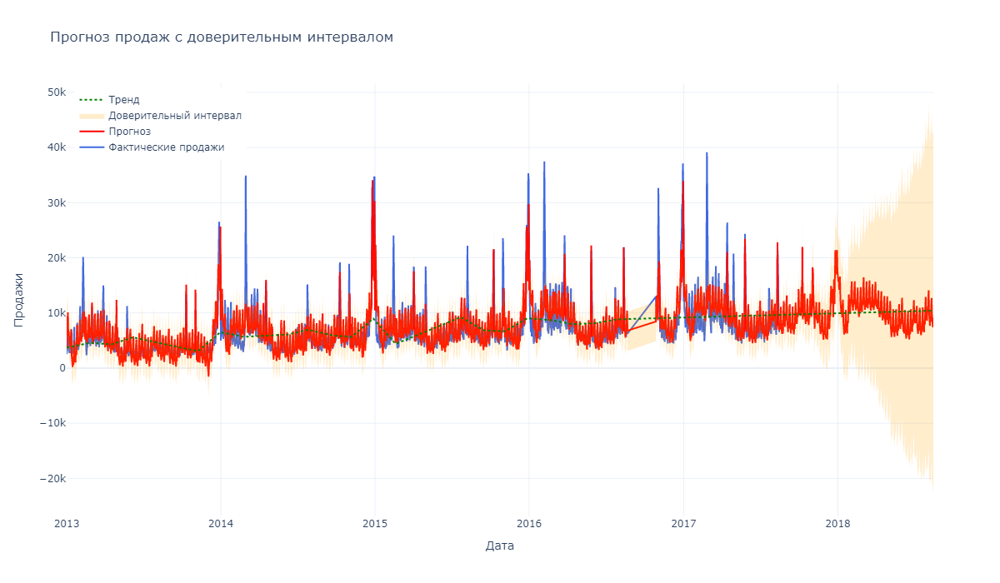

---------------------------------------------------------------------------------------------------------------------------


In [26]:
# Создаём объект класса 'Prophet()'       
Prophet_model = Prophet(changepoint_prior_scale = 5, holidays = holidays)

# Добавляем месячную сезонность
Prophet_model.add_seasonality(
    name = 'monthly',
    period = 30.5,
    fourier_order = 5
)

# Обучаем модель
Prophet_model.fit(unit_sales_data)

# Делаем предсказание
future = Prophet_model.make_future_dataframe(periods = 365)
forecast = Prophet_model.predict(future)



# Вычислим среднеквадратичную ошибку.
print()
print('RMSE: %f' % np.sqrt(np.mean((forecast.loc[:1682, 'yhat']-unit_sales_data['y'])**2)))
print('-' * 55)

# Строим график
time_series_go2(
    data = unit_sales_data,
    forecast = forecast,
    main_title = 'Линейный график предсказанного временного ряда на год вперёд ("changepoint_prior_scale" = 5):',
    title = 'Прогноз продаж с доверительным интервалом',
    color = 'royalblue'
)

**Вывод:**

Добавив информацию по праздничным дням, качество модели удалось ещё сильнее улучшить, при этом итоговая метрика `RMSE` равна $2727$.

#### $5.6$

#### **XGBoost,** **CatBoost.**

Сделаем предсказания для временных рядов с использованием `XGBoost` и `CatBoost`. Но для начала, создадим новые признаки из `date`.

Заново разобъём наш ряд на тренировочную и тестовую выборки:

In [195]:
# Сортировка по дате
train_df_sort = train_df.sort_values('date')


# Инициализация TimeSeriesSplit
tscv_split = model_selection.TimeSeriesSplit(
    n_splits = 3,
    test_size = 7
)


# Разбиение данных
for fold, (train_index, test_index) in enumerate(tscv_split.split(train_df_sort)):
    train_data_fold = train_df_sort.iloc[train_index]
    test_data_fold = train_df_sort.iloc[test_index]
    
    print()
    print(f"Fold {fold + 1}:\n")
    print(f"Train indices: {train_index}")
    print(f"Test indices: {test_index}")
    print(f"Train shape: {train_data_fold.shape}")
    print(f"Test shape: {test_data_fold.shape}")
    print(f"Train dates range: {train_data_fold['date'].min()} to {train_data_fold['date'].max()}")
    print(f"Test dates range: {test_data_fold['date'].min()} to {test_data_fold['date'].max()}")
    print(f'TRAIN size: {len(train_index)},\nTEST size: {len(test_index)}')
    print('-' * 65)
    print('\n')


Fold 1:

Train indices: [   0    1    2 ... 1594 1595 1596]
Test indices: [1597 1598 1599 1600 1601 1602 1603]
Train shape: (1597, 2)
Test shape: (7, 2)
Train dates range: 2013-01-01 00:00:00 to 2017-07-25 00:00:00
Test dates range: 2017-07-26 00:00:00 to 2017-08-01 00:00:00
TRAIN size: 1597,
TEST size: 7
-----------------------------------------------------------------



Fold 2:

Train indices: [   0    1    2 ... 1601 1602 1603]
Test indices: [1604 1605 1606 1607 1608 1609 1610]
Train shape: (1604, 2)
Test shape: (7, 2)
Train dates range: 2013-01-01 00:00:00 to 2017-08-01 00:00:00
Test dates range: 2017-08-02 00:00:00 to 2017-08-08 00:00:00
TRAIN size: 1604,
TEST size: 7
-----------------------------------------------------------------



Fold 3:

Train indices: [   0    1    2 ... 1608 1609 1610]
Test indices: [1611 1612 1613 1614 1615 1616 1617]
Train shape: (1611, 2)
Test shape: (7, 2)
Train dates range: 2013-01-01 00:00:00 to 2017-08-08 00:00:00
Test dates range: 2017-08-09 00:

Создадим функцию для извлечения информации из признака `date` в отдельные признаки:

In [196]:
# Создаём функцию 'create_features'    
def create_features(data, label = None):
    
    
    '''               
    
    Функция для создания новых признаков из "date"          
    
    Параметры:
       - data: данные,
       - label: целевая переменная
       
    '''
    
    
    # Создаём копию данных
    data = data.copy()

    # Убедимся, что колонка 'date' существует и в datetime формате
    if not np.issubdtype(data['date'].dtype, np.datetime64):
        data['date'] = pd.to_datetime(data['date'])

    # Устанавливаем индексом дату
    data.set_index('date', inplace = True)

    # Извлекаем признаки времени
    data['dayofweek'] = data.index.dayofweek
    data['quarter'] = data.index.quarter
    data['month'] = data.index.month
    data['year'] = data.index.year
    data['dayofyear'] = data.index.dayofyear
    data['dayofmonth'] = data.index.day
    data['weekofyear'] = data.index.isocalendar().week.astype(int) 

    # Формируем X и y
    X = data[['dayofweek', 'quarter', 'month', 'year', 'dayofyear', 'dayofmonth', 'weekofyear']]
    
    if label:
        y = data[label]
        return X, y
    
    return X

Создаём новые признаки на тренировочной и тестовой выборках:

In [197]:
# Создаём признаки
X_train, y_train = create_features(train_data_fold, label = 'unit_sales')
X_test, y_test = create_features(test_data_fold, label = 'unit_sales')



# Выводим информацию по тренеровочной выборке
check_data_inf(
    data = X_train,
    data_name = 'X_train',
    length1 = 40,
    length2 = 98
)
print('\n\n')

# Выводим информацию по тестовой выборке
check_data_inf(
    data = X_test,
    data_name = 'X_test',
    length1 = 40,
    length2 = 80
)


Данные таблицы "X_train" имеют следующую размерность:

Количество строк: 1611;
Количество признаков (столбцов): 7.
----------------------------------------


,dayofweek,quarter,month,year,dayofyear,dayofmonth,weekofyear
date,,,,,,,
2013-01-01,1,1,1,2013,1,1,1
2013-01-02,2,1,1,2013,2,2,1
2013-01-03,3,1,1,2013,3,3,1
2013-01-04,4,1,1,2013,4,4,1
2013-01-05,5,1,1,2013,5,5,1
...,...,...,...,...,...,...,...
2017-08-04,4,3,8,2017,216,4,31
2017-08-05,5,3,8,2017,217,5,31
2017-08-06,6,3,8,2017,218,6,31


--------------------------------------------------------------------------------------------------




Данные таблицы "X_test" имеют следующую размерность:

Количество строк: 7;
Количество признаков (столбцов): 7.
----------------------------------------


,dayofweek,quarter,month,year,dayofyear,dayofmonth,weekofyear
date,,,,,,,
2017-08-09,2,3,8,2017,221,9,32
2017-08-10,3,3,8,2017,222,10,32
2017-08-11,4,3,8,2017,223,11,32
2017-08-12,5,3,8,2017,224,12,32
2017-08-13,6,3,8,2017,225,13,32
2017-08-14,0,3,8,2017,226,14,33
2017-08-15,1,3,8,2017,227,15,33


--------------------------------------------------------------------------------


Инициализируем модели `XGBoost` и `CatBoost`:

In [198]:
# Создаём объект класса 'XGBRegressor'                
XGBR_model = xgb.XGBRegressor(n_estimators = 1000, early_stopping_rounds = 50)

# Обучаем модель
XGBR_model.fit(
    X_train, y_train,
    eval_set = [(X_train, y_train), (X_test, y_test)],
    verbose = False
)




# Создаём объект класса 'CatBoostRegressor'                 
CBR_model = CatBoostRegressor(n_estimators = 1000)

# Обучаем модель
CBR_model.fit(
    X_train, y_train,
    eval_set = [(X_train, y_train), (X_test, y_test)],
    early_stopping_rounds = 50,
    verbose = False
)

Создадим функцию для визуализации важности признаков:

In [199]:
# Создаём функцию 'features_importance_bar'
def features_importance_bar(importance, features, main_title, title, color, colorscale):
    
    ''''
    
    Функция для построения визуализации важности признаков.
    
    Параметры:
      - importance  (уровень важности признаков),
      - features    (список признаков),
      - main_title  (заголовок графика),
      - title       (заголовок на графике),
      - color       (цветовая палитра),
      - colorscale  (расцветка столбцов).
    
    '''
    
    
    
    # Задаём заголовок для графика
    print(f'\n{main_title}:')
    print('-' * 123)
    
    
    
    # Получаем важность признаков
    feature_importance = importance
    features_list = features
    
    # Создаём DataFrame
    df = pd.DataFrame(
        {
            'Feature': features_list,
            'Importance': feature_importance
        }
    ).sort_values(by = 'Importance', ascending = True)


    # Визуализация
    fig = px.bar(
        df, 
        x = 'Importance', 
        y = 'Feature', 
        orientation = 'h',
        title = title,
        text = 'Importance',
        height = 700,
        width = 1200
    )

    # Настраиваем фофрмление
    fig.update_traces(
        marker_color = color,
        marker = dict(colorscale = colorscale)
    )

    # Настраиваем оформление всей фигуры
    fig.update_layout(
        height = 700,
        width = 1200,
        template = 'plotly_white'
    )



    # Отображаем график
    fig.show('png')
    print('-' * 123)

Отображаем важность признаков:


График важности признаков для модели "XGBoost"::
---------------------------------------------------------------------------------------------------------------------------


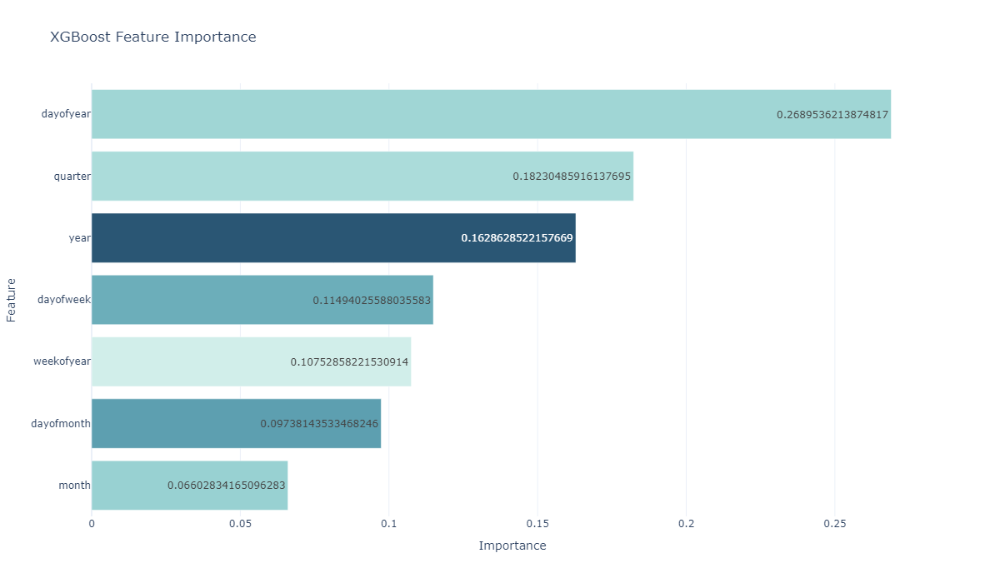

---------------------------------------------------------------------------------------------------------------------------



График важности признаков для модели "CatBoost"::
---------------------------------------------------------------------------------------------------------------------------


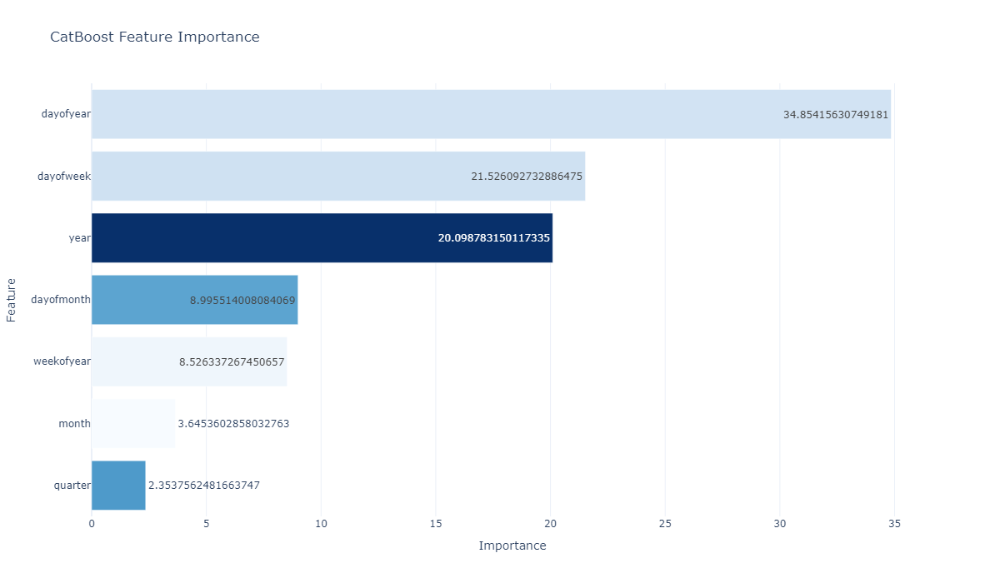

---------------------------------------------------------------------------------------------------------------------------


In [200]:
# Выводим график важности признаков модели "XGBoost"
features_importance_bar(
    importance = XGBR_model.feature_importances_,
    features = X_train.columns,
    main_title = 'График важности признаков для модели "XGBoost":',
    title = 'XGBoost Feature Importance',
    color = XGBR_model.feature_importances_,
    colorscale = 'Teal'
)
print('\n')



# Выводим график важности признаков модели "CatBoost"
features_importance_bar(
    importance = CBR_model.feature_importances_,
    features = X_train.columns,
    main_title = 'График важности признаков для модели "CatBoost":',
    title = 'CatBoost Feature Importance',
    color = CBR_model.feature_importances_,
    colorscale = 'Blues'
)

**Вывод:**

Самым важным признаком, по мнению обеих моделей, является `dayofyear`, так как он указывает на сезонность (пик продаж на праздники, смену сезонов, распродажи). Важность признака `dayofweek` может заключаться в периодичности (рост продаж по выходным, спад по будням, и т.д.).

Делаем предсказание на тестовой выборке:

In [201]:
# Предсказание для XGBoost 
test_data_fold['us_prediction_xgb'] = XGBR_model.predict(X_test)
data_xgb = pd.concat([test_data_fold[['date', 'unit_sales', 'us_prediction_xgb']], train_data_fold], sort = False)

# Предсказание для XGBoost 
test_data_fold['us_prediction_cbr'] = CBR_model.predict(X_test)
data_cbr = pd.concat([test_data_fold[['date', 'unit_sales', 'us_prediction_cbr']], train_data_fold], sort = False)



# Выведем результаты
check_data_inf(
    data = data_xgb,
    data_name = 'data_xgb',
    length1 = 40,
    length2 = 45
)
print('\n\n')

check_data_inf(
    data = data_cbr,
    data_name = 'data_cbr',
    length1 = 40,
    length2 = 45
)


Данные таблицы "data_xgb" имеют следующую размерность:

Количество строк: 1618;
Количество признаков (столбцов): 3.
----------------------------------------


C:\Users\User\AppData\Local\Temp\ipykernel_11032\1158152761.py:2: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

C:\Users\User\AppData\Local\Temp\ipykernel_11032\1158152761.py:6: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy



,date,unit_sales,us_prediction_xgb
1611,2017-08-09,9707.858,9484.707031
1612,2017-08-10,10781.434,10316.984375
1613,2017-08-11,22800.841,16647.423828
1614,2017-08-12,15090.753,17607.558594
1615,2017-08-13,8570.598,13660.166016
...,...,...,...
1606,2017-08-04,9276.890,NaN
1607,2017-08-05,9910.015,NaN
1608,2017-08-06,8064.109,NaN
1609,2017-08-07,7527.348,NaN


---------------------------------------------




Данные таблицы "data_cbr" имеют следующую размерность:

Количество строк: 1618;
Количество признаков (столбцов): 3.
----------------------------------------


,date,unit_sales,us_prediction_cbr
1611,2017-08-09,9707.858,9663.023825
1612,2017-08-10,10781.434,9061.107076
1613,2017-08-11,22800.841,15847.591587
1614,2017-08-12,15090.753,16892.508410
1615,2017-08-13,8570.598,12743.524348
...,...,...,...
1606,2017-08-04,9276.890,NaN
1607,2017-08-05,9910.015,NaN
1608,2017-08-06,8064.109,NaN
1609,2017-08-07,7527.348,NaN


---------------------------------------------


Создадим функцию для построения визуализации полученного прогноза:

In [202]:
# Создаём функцию 'forecast_plotly' для визуализации прогноза
def forecast_plotly(x_data, y1_data, y2_data, name1, name2, main_title, title, main_color, predict_color):
    
    '''
    
    Функция для построения визуализации прогноза.
    
    Параметры:
        - data: данные, содержащие спрогнозированные значения,
        - main_title: основной заголовок графика,
        - title: заголовок на графике,
        - main_color: цвет основной части графика,
        - predict_color: цвет спрогнозированной части графика.
        
    '''
    
    # Задаём заголовок графика
    print(f'\n{main_title}')
    print('-' * 123)
    
    
    # Построение интерактивного графика
    fig = go.Figure()
    
    # Истинные значения 'unit_sales'
    fig.add_trace(
        go.Scatter(
            x = x_data,
            y = y1_data,
            mode = 'lines',
            name = name1,
            line = dict(color = main_color)
        )
    )
    
    # Предсказания модели XGBoost
    fig.add_trace(
        go.Scatter(
            x = x_data,
            y = y2_data,
            mode = 'lines',
            name = name2,
            line = dict(color = predict_color, dash = 'dot')
        )
    )
    
    # Настройка графика
    fig.update_layout(
        title = title,
        xaxis_title = 'Дата',
        yaxis_title = 'Unit Sales',
        template = 'plotly_white',
        legend = dict(x=0.01, y=0.99),
        height = 700,
        width = 1200
    )
    
    
    # Выводим график
    py.iplot(fig)
    print('-' * 123)

Строим графики прогноза моделей `XGBoost` и `CatBoost`:

In [205]:
# Строим график прогноза "XGBoost"
forecast_plotly(
    x_data = data_xgb.index,
    y1_data = data_xgb['unit_sales'],
    y2_data = data_xgb['us_prediction_xgb'],
    name1 = 'Фактические значения',
    name2 = 'Прогнозные значения "XGBoost"',
    main_title = 'Линейный график фактических и спрогнозированных значений "XGBoost":',
    title = 'Фактические vs Прогнозные значения ("XGBoost")',
    main_color = 'skyblue',
    predict_color = 'red'
)
print('\n\n')



# Строим график прогноза "CatBoost"
forecast_plotly(
    x_data = data_cbr.index,
    y1_data = data_cbr['unit_sales'],
    y2_data = data_cbr['us_prediction_cbr'],
    name1 = 'Фактические значения',
    name2 = 'Прогнозные значения "CatBoost"',
    main_title = 'Линейный график фактических и спрогнозированных значений "CatBoost":',
    title = 'Фактические vs Прогнозные значения ("CatBoost")',
    main_color = '#1f77b4',
    predict_color = 'orange'
)


Линейный график фактических и спрогнозированных значений "XGBoost":
---------------------------------------------------------------------------------------------------------------------------


---------------------------------------------------------------------------------------------------------------------------




Линейный график фактических и спрогнозированных значений "CatBoost":
---------------------------------------------------------------------------------------------------------------------------


---------------------------------------------------------------------------------------------------------------------------


Рассчитываем метрики:

In [206]:
# Считаем метрики модели 'XGBoost'
print_metrics(
    y_true = test_data_fold['unit_sales'],
    y_predict = test_data_fold['us_prediction_xgb'],
    model_name = 'XGBoost'
)
print('\n')


# Считаем метрики модели 'CatBoost'
print_metrics(
    y_true = test_data_fold['unit_sales'],
    y_predict = test_data_fold['us_prediction_cbr'],
    model_name = 'CatBoost'
)


XGBoost (значения метрик):

Mean Squared Error: 10404760.478
-----------------------------------
Root Mean Squared Error: 3225.641
-----------------------------------
Mean Absolute Error: 2372.928
-----------------------------------
R²: 0.613
-----------------------------------
Mean Absolute Percentage Error: 19.793%
----------------------------------------



CatBoost (значения метрик):

Mean Squared Error: 10366792.114
-----------------------------------
Root Mean Squared Error: 3219.750
-----------------------------------
Mean Absolute Error: 2252.962
-----------------------------------
R²: 0.614
-----------------------------------
Mean Absolute Percentage Error: 17.433%
----------------------------------------


**Вывод:**

`CatBoost` немного, но стабильно обходит `XGBoost` по всем метрикам на тестовой выборке. Метрики `MAE` и `MAPE` ниже, значит модель предсказывает ближе к реальным значениям в абсолютных и относительных единицах. Даже `R²` чуть выше — модель чуть лучше объясняет дисперсию целевой переменной.

**Добавление праздничных дней.**

Припомощи библиотеки `holidays` добавим данные о праздничных днях Эквадора, так же добавим дополнительные признаки, чтобы захватывать влияние ближайших праздничных дней.

Дополним ранее созданную функцию `create_features` признаками праздничных дней:

In [208]:
# Выделим праздники Эквадора
ec_holidays = holidays.Ecuador()



# Создаём функцию 'create_features'    
def create_features(data, label = None):
    
    
    '''               
    
    Функция для создания новых признаков из "date"          
    
    Параметры:
       - data: данные,
       - label: целевая переменная
       
    '''
    
    
    # Создаём копию данных
    data = data.copy()

    # Убедимся, что колонка 'date' существует и в datetime формате
    if not np.issubdtype(data['date'].dtype, np.datetime64):
        data['date'] = pd.to_datetime(data['date'])
        
    # Преобразуем в обычную дату без времени
    data['date_original'] = data['date'].dt.date

    # Устанавливаем индексом дату
    data.set_index('date', inplace = True)

    # Извлекаем признаки времени
    data['dayofweek'] = data.index.dayofweek
    data['quarter'] = data.index.quarter
    data['month'] = data.index.month
    data['year'] = data.index.year
    data['dayofyear'] = data.index.dayofyear
    data['dayofmonth'] = data.index.day
    data['weekofyear'] = data.index.isocalendar().week.astype(int) 
            
    # Создаём признаки праздничных дней
    data['is_holiday'] = data['date_original'].apply(lambda x: 1 if x in ec_holidays else 0)
    data['before_holiday'] = data['date_original'].apply(lambda x: 1 if (x - pd.Timedelta(days = 1)) in ec_holidays else 0)
    data['after_holiday'] = data['date_original'].apply(lambda x: 1 if (x + pd.Timedelta(days = 1)) in ec_holidays else 0)
    
    # Удалим промежуточный столбец
    data.drop(columns = ['date_original'], inplace = True)

    # Формируем X и y
    X = data[[
        'dayofweek', 'quarter', 'month', 'year', 'dayofyear', 'dayofmonth',
        'weekofyear', 'is_holiday', 'before_holiday', 'after_holiday'
    ]]
    
    if label:
        y = data[label]
        return X, y
    
    return X

Создаём новые признаки:

In [209]:
# Создаём признаки
X_train, y_train = create_features(train_data_fold, label = 'unit_sales')
X_test, y_test = create_features(test_data_fold, label = 'unit_sales')



# Выводим информацию по тренеровочной выборке
check_data_inf(
    data = X_train,
    data_name = 'X_train',
    length1 = 40,
    length2 = 120
)
print('\n\n')

# Выводим информацию по тестовой выборке
check_data_inf(
    data = X_test,
    data_name = 'X_test',
    length1 = 40,
    length2 = 120
)


Данные таблицы "X_train" имеют следующую размерность:

Количество строк: 1611;
Количество признаков (столбцов): 10.
----------------------------------------


,dayofweek,quarter,month,year,dayofyear,dayofmonth,weekofyear,is_holiday,before_holiday,after_holiday
date,,,,,,,,,,
2013-01-01,1,1,1,2013,1,1,1,1,0,0
2013-01-02,2,1,1,2013,2,2,1,0,1,0
2013-01-03,3,1,1,2013,3,3,1,0,0,0
2013-01-04,4,1,1,2013,4,4,1,0,0,0
2013-01-05,5,1,1,2013,5,5,1,0,0,0
...,...,...,...,...,...,...,...,...,...,...
2017-08-04,4,3,8,2017,216,4,31,0,0,0
2017-08-05,5,3,8,2017,217,5,31,0,0,0
2017-08-06,6,3,8,2017,218,6,31,0,0,0


------------------------------------------------------------------------------------------------------------------------




Данные таблицы "X_test" имеют следующую размерность:

Количество строк: 7;
Количество признаков (столбцов): 10.
----------------------------------------


,dayofweek,quarter,month,year,dayofyear,dayofmonth,weekofyear,is_holiday,before_holiday,after_holiday
date,,,,,,,,,,
2017-08-09,2,3,8,2017,221,9,32,0,0,1
2017-08-10,3,3,8,2017,222,10,32,1,0,1
2017-08-11,4,3,8,2017,223,11,32,1,1,0
2017-08-12,5,3,8,2017,224,12,32,0,1,0
2017-08-13,6,3,8,2017,225,13,32,0,0,0
2017-08-14,0,3,8,2017,226,14,33,0,0,0
2017-08-15,1,3,8,2017,227,15,33,0,0,0


------------------------------------------------------------------------------------------------------------------------


Заново инициализируем модели `XGBoost` и `CatBoost`:

In [210]:
# Создаём объект класса 'XGBRegressor'                
XGBR_model = xgb.XGBRegressor(n_estimators = 1000, early_stopping_rounds = 50)

# Обучаем модель
XGBR_model.fit(
    X_train, y_train,
    eval_set = [(X_train, y_train), (X_test, y_test)],
    verbose = False
)




# Создаём объект класса 'CatBoostRegressor'                 
CBR_model = CatBoostRegressor(n_estimators = 1000)

# Обучаем модель
CBR_model.fit(
    X_train, y_train,
    eval_set = [(X_train, y_train), (X_test, y_test)],
    early_stopping_rounds = 50,
    verbose = False
)

Отображаем важность признаков:


График важности признаков для модели "XGBoost"::
---------------------------------------------------------------------------------------------------------------------------


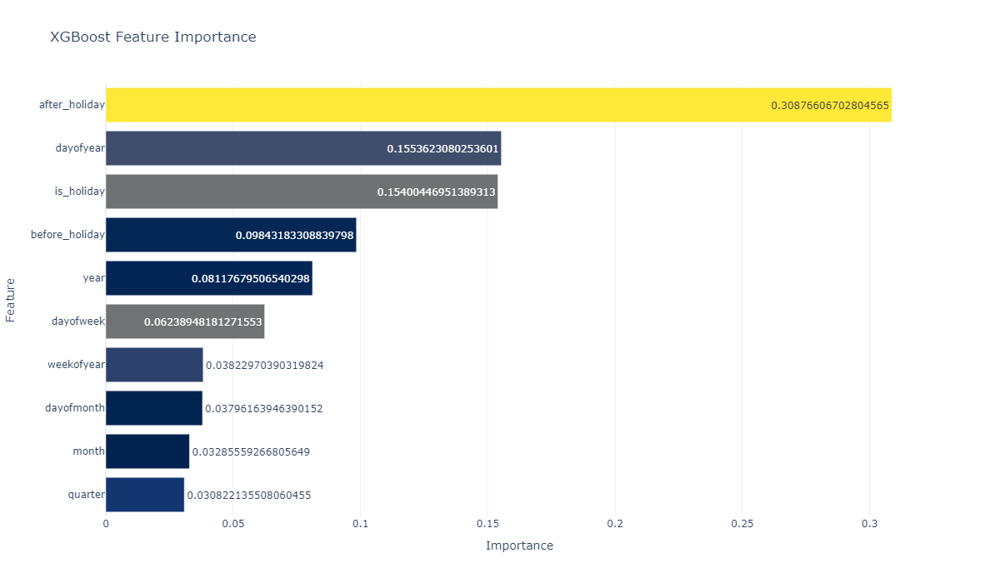

---------------------------------------------------------------------------------------------------------------------------



График важности признаков для модели "CatBoost"::
---------------------------------------------------------------------------------------------------------------------------


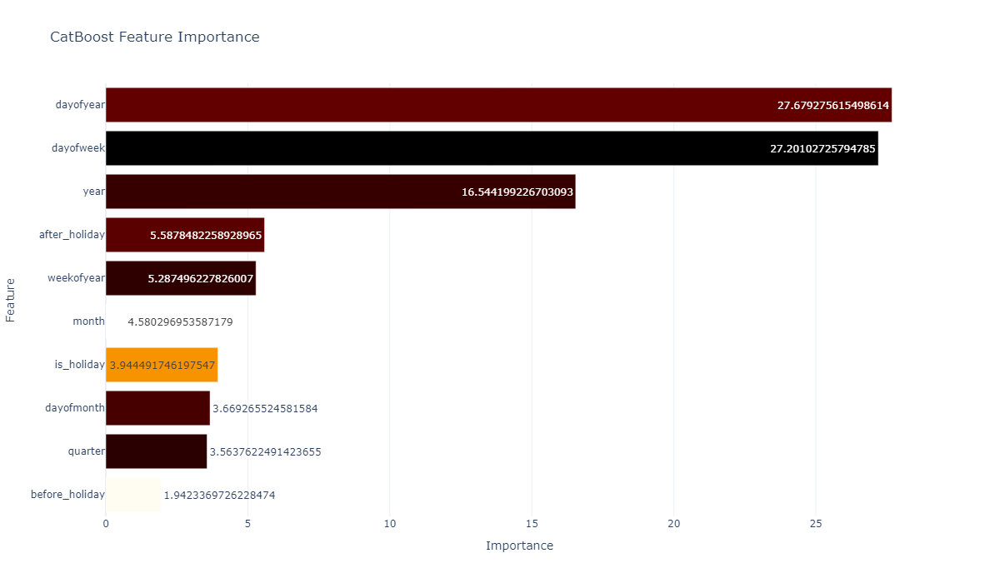

---------------------------------------------------------------------------------------------------------------------------


In [211]:
# Выводим график важности признаков модели "XGBoost"
features_importance_bar(
    importance = XGBR_model.feature_importances_,
    features = X_train.columns,
    main_title = 'График важности признаков для модели "XGBoost":',
    title = 'XGBoost Feature Importance',
    color = XGBR_model.feature_importances_,
    colorscale = 'Cividis'
)
print('\n')



# Выводим график важности признаков модели "CatBoost"
features_importance_bar(
    importance = CBR_model.feature_importances_,
    features = X_train.columns,
    main_title = 'График важности признаков для модели "CatBoost":',
    title = 'CatBoost Feature Importance',
    color = CBR_model.feature_importances_,
    colorscale = 'Hot'
)

**Вывод:**

Результат стал немного интереснее, модель `XGBoost` самым информативным выделила признак **after_holiday**, в то время, как `CatBoost` отдал предпочтение **dayofyear**. Далее посмотрим на результаты.

Делаем предсказание на тестовой выборке:

In [212]:
# Предсказание для XGBoost 
test_data_fold['us_prediction_xgb'] = XGBR_model.predict(X_test)
data_xgb = pd.concat([test_data_fold[['date', 'unit_sales', 'us_prediction_xgb']], train_data_fold], sort = False)

# Предсказание для XGBoost 
test_data_fold['us_prediction_cbr'] = CBR_model.predict(X_test)
data_cbr = pd.concat([test_data_fold[['date', 'unit_sales', 'us_prediction_cbr']], train_data_fold], sort = False)



# Выведем результаты
check_data_inf(
    data = data_xgb,
    data_name = 'data_xgb',
    length1 = 40,
    length2 = 45
)
print('\n\n')

check_data_inf(
    data = data_cbr,
    data_name = 'data_cbr',
    length1 = 40,
    length2 = 45
)


Данные таблицы "data_xgb" имеют следующую размерность:

Количество строк: 1618;
Количество признаков (столбцов): 3.
----------------------------------------


C:\Users\User\AppData\Local\Temp\ipykernel_11032\1158152761.py:2: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

C:\Users\User\AppData\Local\Temp\ipykernel_11032\1158152761.py:6: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy



,date,unit_sales,us_prediction_xgb
1611,2017-08-09,9707.858,9824.976562
1612,2017-08-10,10781.434,17339.425781
1613,2017-08-11,22800.841,19177.576172
1614,2017-08-12,15090.753,13985.979492
1615,2017-08-13,8570.598,9676.260742
...,...,...,...
1606,2017-08-04,9276.890,NaN
1607,2017-08-05,9910.015,NaN
1608,2017-08-06,8064.109,NaN
1609,2017-08-07,7527.348,NaN


---------------------------------------------




Данные таблицы "data_cbr" имеют следующую размерность:

Количество строк: 1618;
Количество признаков (столбцов): 3.
----------------------------------------


,date,unit_sales,us_prediction_cbr
1611,2017-08-09,9707.858,12023.857569
1612,2017-08-10,10781.434,16454.086206
1613,2017-08-11,22800.841,20730.922880
1614,2017-08-12,15090.753,14493.085289
1615,2017-08-13,8570.598,8639.311197
...,...,...,...
1606,2017-08-04,9276.890,NaN
1607,2017-08-05,9910.015,NaN
1608,2017-08-06,8064.109,NaN
1609,2017-08-07,7527.348,NaN


---------------------------------------------


Строим графики прогноза моделей `XGBoost` и `CatBoost`:

In [213]:
# Строим график прогноза "XGBoost"
forecast_plotly(
    x_data = data_xgb.index,
    y1_data = data_xgb['unit_sales'],
    y2_data = data_xgb['us_prediction_xgb'],
    name1 = 'Фактические значения',
    name2 = 'Прогнозные значения "XGBoost"',
    main_title = 'Линейный график фактических и спрогнозированных значений "XGBoost":',
    title = 'Фактические vs Прогнозные значения ("XGBoost")',
    main_color = 'lightblue',
    predict_color = 'red'
)
print('\n\n')



# Строим график прогноза "CatBoost"
forecast_plotly(
    x_data = data_cbr.index,
    y1_data = data_cbr['unit_sales'],
    y2_data = data_cbr['us_prediction_cbr'],
    name1 = 'Фактические значения',
    name2 = 'Прогнозные значения "CatBoost"',
    main_title = 'Линейный график фактических и спрогнозированных значений "CatBoost":',
    title = 'Фактические vs Прогнозные значения ("CatBoost")',
    main_color = 'darkred',
    predict_color = 'orange'
)


Линейный график фактических и спрогнозированных значений "XGBoost":
---------------------------------------------------------------------------------------------------------------------------


---------------------------------------------------------------------------------------------------------------------------




Линейный график фактических и спрогнозированных значений "CatBoost":
---------------------------------------------------------------------------------------------------------------------------


---------------------------------------------------------------------------------------------------------------------------


Рассчитываем метрики:

In [214]:
# Считаем метрики модели 'XGBoost'
print_metrics(
    y_true = test_data_fold['unit_sales'],
    y_predict = test_data_fold['us_prediction_xgb'],
    model_name = 'XGBoost'
)
print('\n')


# Считаем метрики модели 'CatBoost'
print_metrics(
    y_true = test_data_fold['unit_sales'],
    y_predict = test_data_fold['us_prediction_cbr'],
    model_name = 'CatBoost'
)


XGBoost (значения метрик):

Mean Squared Error: 8471441.032
-----------------------------------
Root Mean Squared Error: 2910.574
-----------------------------------
Mean Absolute Error: 1922.389
-----------------------------------
R²: 0.685
-----------------------------------
Mean Absolute Percentage Error: 15.715%
----------------------------------------



CatBoost (значения метрик):

Mean Squared Error: 6259198.489
-----------------------------------
Root Mean Squared Error: 2501.839
-----------------------------------
Mean Absolute Error: 1720.069
-----------------------------------
R²: 0.767
-----------------------------------
Mean Absolute Percentage Error: 15.200%
----------------------------------------


**Вывод:**

Добавление праздничных дней, как и было ожидаемо, улучшило предсказание моделей.

**Добавление лагов.**

Добавим в данные признаки лагов от $1$ до $5$ при размере тестовой выборки равной $7$.

Дополним ранее созданную функцию `create_features` признаками лагов:

In [215]:
# Выделим праздники Эквадора
ec_holidays = holidays.Ecuador()



# Создаём функцию 'create_features'    
def create_features(data, lag_days, label = None):
    
    
    '''               
    
    Функция для создания новых признаков из "date"          
    
    Параметры:
       - data      (данные),
       - lag_days  (список лагов), 
       - label     (целевая переменная).
       
    '''
    
    
    # Создаём копию данных
    data = data.copy()
    data = data.sort_values('date')

    # Убедимся, что колонка 'date' существует и в datetime формате
    if not np.issubdtype(data['date'].dtype, np.datetime64):
        data['date'] = pd.to_datetime(data['date'])
        
    # Преобразуем в обычную дату без времени
    data['date_original'] = data['date'].dt.date

    # Устанавливаем индексом дату
    data.set_index('date', inplace = True)

    # Извлекаем признаки времени
    data['dayofweek'] = data.index.dayofweek
    data['quarter'] = data.index.quarter
    data['month'] = data.index.month
    data['year'] = data.index.year
    data['dayofyear'] = data.index.dayofyear
    data['dayofmonth'] = data.index.day
    data['weekofyear'] = data.index.isocalendar().week.astype(int) 
            
    # Создаём признаки праздничных дней
    data['is_holiday'] = data['date_original'].apply(lambda x: 1 if x in ec_holidays else 0)
    data['before_holiday'] = data['date_original'].apply(lambda x: 1 if (x - pd.Timedelta(days = 1)) in ec_holidays else 0)
    data['after_holiday'] = data['date_original'].apply(lambda x: 1 if (x + pd.Timedelta(days = 1)) in ec_holidays else 0)
    
    # Добавляем лаги
    for lag in lag_days:
        data[f'{label}_lag_{lag}'] = data[label].shift(lag)
    
    # Удалим промежуточный столбец
    data.drop(columns = ['date_original'], inplace = True)

    # Формируем X и y
    X = data[[
        'dayofweek', 'quarter', 'month', 'year', 'dayofyear', 'dayofmonth', 'weekofyear', 
        'is_holiday', 'before_holiday', 'after_holiday', 'unit_sales_lag_1', 'unit_sales_lag_2',
        'unit_sales_lag_3', 'unit_sales_lag_4', 'unit_sales_lag_5'
    ]]
    
    if label:
        y = data[label]
        return X, y
    
    return X

Заново создаём признаки:

In [216]:
# Создаём признаки
X_train, y_train = create_features(train_data_fold, lag_days=[1, 2, 3, 4, 5], label='unit_sales')
X_test, y_test = create_features(test_data_fold, lag_days=[1, 2, 3, 4, 5], label='unit_sales')



# Выводим информацию по тренеровочной выборке
check_data_inf(
    data = X_train.head(),
    data_name = 'X_train',
    length1 = 40,
    length2 = 120
)
print('\n\n')

# Выводим информацию по тестовой выборке
check_data_inf(
    data = X_test.head(),
    data_name = 'X_test',
    length1 = 40,
    length2 = 120
)


Данные таблицы "X_train" имеют следующую размерность:

Количество строк: 5;
Количество признаков (столбцов): 15.
----------------------------------------


,dayofweek,quarter,month,year,dayofyear,dayofmonth,weekofyear,is_holiday,before_holiday,after_holiday,unit_sales_lag_1,unit_sales_lag_2,unit_sales_lag_3,unit_sales_lag_4,unit_sales_lag_5
date,,,,,,,,,,,,,,,
2013-01-01,1,1,1,2013,1,1,1,1,0,0,NaN,NaN,NaN,NaN,NaN
2013-01-02,2,1,1,2013,2,2,1,0,1,0,2511.619,NaN,NaN,NaN,NaN
2013-01-03,3,1,1,2013,3,3,1,0,0,0,5316.224,2511.619,NaN,NaN,NaN
2013-01-04,4,1,1,2013,4,4,1,0,0,0,4442.913,5316.224,2511.619,NaN,NaN
2013-01-05,5,1,1,2013,5,5,1,0,0,0,4844.354,4442.913,5316.224,2511.619,NaN


------------------------------------------------------------------------------------------------------------------------




Данные таблицы "X_test" имеют следующую размерность:

Количество строк: 5;
Количество признаков (столбцов): 15.
----------------------------------------


,dayofweek,quarter,month,year,dayofyear,dayofmonth,weekofyear,is_holiday,before_holiday,after_holiday,unit_sales_lag_1,unit_sales_lag_2,unit_sales_lag_3,unit_sales_lag_4,unit_sales_lag_5
date,,,,,,,,,,,,,,,
2017-08-09,2,3,8,2017,221,9,32,0,0,1,NaN,NaN,NaN,NaN,NaN
2017-08-10,3,3,8,2017,222,10,32,1,0,1,9707.858,NaN,NaN,NaN,NaN
2017-08-11,4,3,8,2017,223,11,32,1,1,0,10781.434,9707.858,NaN,NaN,NaN
2017-08-12,5,3,8,2017,224,12,32,0,1,0,22800.841,10781.434,9707.858,NaN,NaN
2017-08-13,6,3,8,2017,225,13,32,0,0,0,15090.753,22800.841,10781.434,9707.858,NaN


------------------------------------------------------------------------------------------------------------------------


Заново инициализируем модели `XGBoost` и `CatBoost`:

In [217]:
# Создаём объект класса 'XGBRegressor'                
XGBR_model = xgb.XGBRegressor(n_estimators = 1000, early_stopping_rounds = 50)

# Обучаем модель
XGBR_model.fit(
    X_train, y_train,
    eval_set = [(X_train, y_train), (X_test, y_test)],
    verbose = False
)




# Создаём объект класса 'CatBoostRegressor'                 
CBR_model = CatBoostRegressor(n_estimators = 1000)

# Обучаем модель
CBR_model.fit(
    X_train, y_train,
    eval_set = [(X_train, y_train), (X_test, y_test)],
    early_stopping_rounds = 50,
    verbose = False
)

Отображаем важность признаков:


График важности признаков для модели "XGBoost"::
---------------------------------------------------------------------------------------------------------------------------


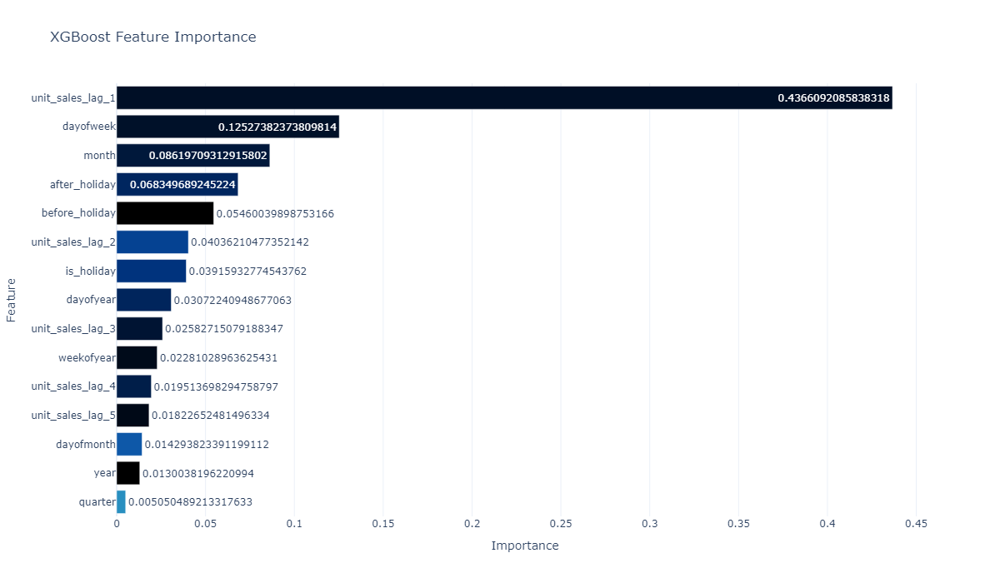

---------------------------------------------------------------------------------------------------------------------------



График важности признаков для модели "CatBoost"::
---------------------------------------------------------------------------------------------------------------------------


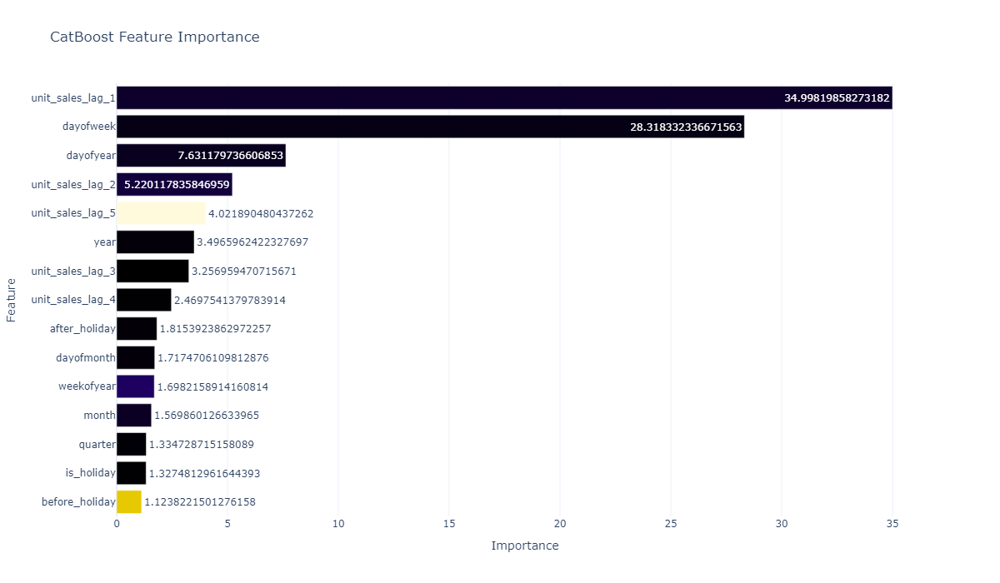

---------------------------------------------------------------------------------------------------------------------------


In [218]:
# Выводим график важности признаков модели "XGBoost"
features_importance_bar(
    importance = XGBR_model.feature_importances_,
    features = X_train.columns,
    main_title = 'График важности признаков для модели "XGBoost":',
    title = 'XGBoost Feature Importance',
    color = XGBR_model.feature_importances_,
    colorscale = 'IceFire'
)
print('\n')



# Выводим график важности признаков модели "CatBoost"
features_importance_bar(
    importance = CBR_model.feature_importances_,
    features = X_train.columns,
    main_title = 'График важности признаков для модели "CatBoost":',
    title = 'CatBoost Feature Importance',
    color = CBR_model.feature_importances_,
    colorscale = 'Electric'
)

**Вывод:**

После добавления лагов в наши данные, обе модели выделили признак лага `unit_sales_lag_1` как самый важный. При этом стоит заметить, что и остальные признаки лагов входят в топ-$10$ признаков.

Делаем предсказание на тестовой выборке:

In [219]:
# Предсказание для XGBoost 
test_data_fold['us_prediction_xgb'] = XGBR_model.predict(X_test)
data_xgb = pd.concat([test_data_fold[['date', 'unit_sales', 'us_prediction_xgb']], train_data_fold], sort = False)

# Предсказание для XGBoost 
test_data_fold['us_prediction_cbr'] = CBR_model.predict(X_test)
data_cbr = pd.concat([test_data_fold[['date', 'unit_sales', 'us_prediction_cbr']], train_data_fold], sort = False)



# Выведем результаты
check_data_inf(
    data = data_xgb,
    data_name = 'data_xgb',
    length1 = 40,
    length2 = 45
)
print('\n\n')

check_data_inf(
    data = data_cbr,
    data_name = 'data_cbr',
    length1 = 40,
    length2 = 45
)


Данные таблицы "data_xgb" имеют следующую размерность:

Количество строк: 1618;
Количество признаков (столбцов): 3.
----------------------------------------


C:\Users\User\AppData\Local\Temp\ipykernel_11032\1158152761.py:2: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

C:\Users\User\AppData\Local\Temp\ipykernel_11032\1158152761.py:6: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy



,date,unit_sales,us_prediction_xgb
1611,2017-08-09,9707.858,7220.126465
1612,2017-08-10,10781.434,11944.403320
1613,2017-08-11,22800.841,16743.378906
1614,2017-08-12,15090.753,16684.650391
1615,2017-08-13,8570.598,8341.576172
...,...,...,...
1606,2017-08-04,9276.890,NaN
1607,2017-08-05,9910.015,NaN
1608,2017-08-06,8064.109,NaN
1609,2017-08-07,7527.348,NaN


---------------------------------------------




Данные таблицы "data_cbr" имеют следующую размерность:

Количество строк: 1618;
Количество признаков (столбцов): 3.
----------------------------------------


,date,unit_sales,us_prediction_cbr
1611,2017-08-09,9707.858,4487.233768
1612,2017-08-10,10781.434,9284.950748
1613,2017-08-11,22800.841,12611.989950
1614,2017-08-12,15090.753,11648.770849
1615,2017-08-13,8570.598,8280.302390
...,...,...,...
1606,2017-08-04,9276.890,NaN
1607,2017-08-05,9910.015,NaN
1608,2017-08-06,8064.109,NaN
1609,2017-08-07,7527.348,NaN


---------------------------------------------


Строим графики прогноза моделей `XGBoost` и `CatBoost`:

In [220]:
# Строим график прогноза "XGBoost"
forecast_plotly(
    x_data = data_xgb.index,
    y1_data = data_xgb['unit_sales'],
    y2_data = data_xgb['us_prediction_xgb'],
    name1 = 'Фактические значения',
    name2 = 'Прогнозные значения "XGBoost"',
    main_title = 'Линейный график фактических и спрогнозированных значений "XGBoost":',
    title = 'Фактические vs Прогнозные значения ("XGBoost")',
    main_color = '#1f77b4',
    predict_color = '#d62728'
)
print('\n\n')



# Строим график прогноза "CatBoost"
forecast_plotly(
    x_data = data_cbr.index,
    y1_data = data_cbr['unit_sales'],
    y2_data = data_cbr['us_prediction_cbr'],
    name1 = 'Фактические значения',
    name2 = 'Прогнозные значения "CatBoost"',
    main_title = 'Линейный график фактических и спрогнозированных значений "CatBoost":',
    title = 'Фактические vs Прогнозные значения ("CatBoost")',
    main_color = '#018786', 
    predict_color = '#fde725'
)


Линейный график фактических и спрогнозированных значений "XGBoost":
---------------------------------------------------------------------------------------------------------------------------


---------------------------------------------------------------------------------------------------------------------------




Линейный график фактических и спрогнозированных значений "CatBoost":
---------------------------------------------------------------------------------------------------------------------------


---------------------------------------------------------------------------------------------------------------------------


Рассчитываем метрики:

In [221]:
# Считаем метрики модели 'XGBoost'
print_metrics(
    y_true = test_data_fold['unit_sales'],
    y_predict = test_data_fold['us_prediction_xgb'],
    model_name = 'XGBoost'
)
print('\n')


# Считаем метрики модели 'CatBoost'
print_metrics(
    y_true = test_data_fold['unit_sales'],
    y_predict = test_data_fold['us_prediction_cbr'],
    model_name = 'CatBoost'
)


XGBoost (значения метрик):

Mean Squared Error: 6933707.319
-----------------------------------
Root Mean Squared Error: 2633.193
-----------------------------------
Mean Absolute Error: 1895.825
-----------------------------------
R²: 0.742
-----------------------------------
Mean Absolute Percentage Error: 14.157%
----------------------------------------



CatBoost (значения метрик):

Mean Squared Error: 20889042.306
-----------------------------------
Root Mean Squared Error: 4570.453
-----------------------------------
Mean Absolute Error: 3121.260
-----------------------------------
R²: 0.222
-----------------------------------
Mean Absolute Percentage Error: 22.003%
----------------------------------------


#### **Итоговый вывод по моделям `XGBoost` и `CatBoost`:**

`CatBoost` показывает лучшие результаты в базовой модели и при добавлении праздничных дней. Он особенно хорошо справляется с категориальными признаками. `XGBoost` демонстрирует высокую устойчивость и улучшение после добавления лагов, в то время как `CatBoost` — проседает, возможно, из-за переобучения или чувствительности к коррелированным признакам.

Лучший общий результат по всем метрикам (минимальный $RMSE$ и максимальный $R²$) — у `CatBoost` после добавления праздников. Наиболее стабильная модель при разных изменениях — `XGBoost`.